<a href="https://colab.research.google.com/github/SP-2112/Arcadia-Phoenix-GameDev/blob/main/Code_Notebooks/Team3_CodeFile.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#DOWNLOAD THE DATASET from Drive automatiicly BY RUNNING THIS CELL

In [1]:
# import gdown
# import pandas as pd

# # Google Drive file ID
# file_id = '1R1866o1WjvzY84nOpq6tn6QXUV8SARV5'

# # Construct the URL
# url = f'https://drive.google.com/uc?export=download&id={file_id}'

# # Download the file
# gdown.download(url, '3_modified.csv', quiet=False)

# # Load the dataset
# original_Dataset = pd.read_csv('3_modified.csv')

# # Check the data
# original_Dataset.head()


Downloading...
From: https://drive.google.com/uc?export=download&id=1R1866o1WjvzY84nOpq6tn6QXUV8SARV5
To: /content/3_modified.csv
100%|██████████| 9.12k/9.12k [00:00<00:00, 18.7MB/s]


,Unnamed: 0,Parameters,Random,Plant Height (PH),Number of Pods (NP),Biological Weight (BW),Sugars (Su),Relative Water Content in Leaves (RWCL),ChlorophyllA663,Chlorophyllb649,Protein Percentage (PPE),Weight of 300 Seeds (W3S),Leaf Area Index (LAI),Seed Yield per Unit Area (SYUA),Number of Seeds per Pod (NSP),Protein Content (PCO)
0,0,C1S1G5,R1,50.5,130.3,111.0,0.433,0.732,1.4,3.1,33.2,33.6,0.08,5567.4,1.86,0.82
1,1,C2S3G4,R1,44.5,132.0,80.0,0.334,0.674,7.1,2.2,38.5,34.4,0.09,2245.5,1.87,0.13
2,2,C2S1G6,R1,52.2,150.0,83.0,0.490,0.677,1.8,1.3,33.6,35.2,0.07,4326.7,2.04,0.15
3,3,C1S1G1,R1,50.5,140.8,66.0,0.163,0.745,1.1,3.0,33.5,52.3,0.09,6214.5,2.20,0.14
4,4,C1S2G6,R2,49.2,175.6,73.0,0.795,0.725,7.5,2.1,39.6,31.2,0.10,3897.8,1.88,0.60


In [18]:
! wget https://raw.githubusercontent.com/UtkarshRaj130/Advanced_Soybean_Agricultural_Dataset_Analysis/refs/heads/main/Dataset/3_modified.csv

--2025-04-15 05:14:33--  https://raw.githubusercontent.com/UtkarshRaj130/Advanced_Soybean_Agricultural_Dataset_Analysis/refs/heads/main/Dataset/3_modified.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8904 (8.7K) [text/plain]
Saving to: ‘3_modified.csv’

3_modified.csv      100%[===================>]   8.70K  --.-KB/s    in 0s      

2025-04-15 05:14:34 (17.8 MB/s) - ‘3_modified.csv’ saved [8904/8904]



In [7]:
! wget https://raw.githubusercontent.com/UtkarshRaj130/Advanced_Soybean_Agricultural_Dataset_Analysis/refs/heads/main/Dataset/3.csv

--2025-04-15 05:12:32--  https://raw.githubusercontent.com/UtkarshRaj130/Advanced_Soybean_Agricultural_Dataset_Analysis/refs/heads/main/Dataset/3.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4033804 (3.8M) [text/plain]
Saving to: ‘3.csv’

3.csv               100%[===================>]   3.85M  --.-KB/s    in 0.1s    

2025-04-15 05:12:32 (37.5 MB/s) - ‘3.csv’ saved [4033804/4033804]



In [1]:
import numpy as np
import pandas as pd
import matplotlib as mlp
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from sklearn.feature_selection import mutual_info_regression

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score, adjusted_rand_score
from sklearn.model_selection import ParameterGrid

from scipy.stats import f_oneway,kruskal
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

# Original Dataset - had many duplicates so a modified dataset removing all duplicates was made

In [8]:
original_Dataset=pd.read_csv('3.csv')
original_Dataset

,Parameters,Random,Plant Height (PH),Number of Pods (NP),Biological Weight (BW),Sugars (Su),Relative Water Content in Leaves (RWCL),ChlorophyllA663,Chlorophyllb649,Protein Percentage (PPE),Weight of 300 Seeds (W3S),Leaf Area Index (LAI),Seed Yield per Unit Area (SYUA),Number of Seeds per Pod (NSP),Protein Content (PCO)
0,C1S1G5,R1,50.5,130.3,111,0.433,0.732,1.4,3.1,33.2,33.6,0.08,5567.4,1.86,0.82
1,C2S3G4,R1,44.5,132.0,80,0.334,0.674,7.1,2.2,38.5,34.4,0.09,2245.5,1.87,0.13
2,C2S1G6,R1,52.2,150.0,83,0.490,0.677,1.8,1.3,33.6,35.2,0.07,4326.7,2.04,0.15
3,C1S1G1,R1,50.5,140.8,66,0.163,0.745,1.1,3.0,33.5,52.3,0.09,6214.5,2.20,0.14
4,C1S2G6,R2,49.2,175.6,73,0.795,0.725,7.5,2.1,39.6,31.2,0.10,3897.8,1.88,0.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55445,C1S1G2,R1,52.4,136.0,223,0.523,0.713,1.9,3.3,38.2,38.1,0.07,5216.2,2.06,0.50
55446,C1S1G6,R1,45.7,145.0,111,0.466,0.756,1.4,2.2,37.7,28.8,0.09,3211.2,1.84,0.44
55447,C1S2G2,R1,50.0,166.3,85,0.523,0.676,8.5,1.3,36.5,35.2,0.08,4358.8,2.20,0.58
55448,C1S2G3,R3,44.0,209.0,132,0.663,0.875,9.0,1.3,39.7,31.2,0.06,4472.7,2.60,0.32


In [9]:
original_Dataset.duplicated().sum()

np.int64(55342)

In [10]:
original_Dataset.isnull().sum()

,0
Parameters,0
Random,0
Plant Height (PH),0
Number of Pods (NP),0
Biological Weight (BW),0
Sugars (Su),0
Relative Water Content in Leaves (RWCL),0
ChlorophyllA663,0
Chlorophyllb649,0
Protein Percentage (PPE),0


In [19]:
data=pd.read_csv('3_modified.csv')

In [20]:
data=data.drop(data.columns[0],axis=1)
data

,Parameters,Random,Plant Height (PH),Number of Pods (NP),Biological Weight (BW),Sugars (Su),Relative Water Content in Leaves (RWCL),ChlorophyllA663,Chlorophyllb649,Protein Percentage (PPE),Weight of 300 Seeds (W3S),Leaf Area Index (LAI),Seed Yield per Unit Area (SYUA),Number of Seeds per Pod (NSP),Protein Content (PCO)
0,C1S1G5,R1,50.5,130.3,111,0.433,0.732,1.4,3.1,33.2,33.6,0.08,5567.4,1.86,0.82
1,C2S3G4,R1,44.5,132.0,80,0.334,0.674,7.1,2.2,38.5,34.4,0.09,2245.5,1.87,0.13
2,C2S1G6,R1,52.2,150.0,83,0.490,0.677,1.8,1.3,33.6,35.2,0.07,4326.7,2.04,0.15
3,C1S1G1,R1,50.5,140.8,66,0.163,0.745,1.1,3.0,33.5,52.3,0.09,6214.5,2.20,0.14
4,C1S2G6,R2,49.2,175.6,73,0.795,0.725,7.5,2.1,39.6,31.2,0.10,3897.8,1.88,0.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,C1S2G3,R3,44.0,209.0,132,0.663,0.875,9.0,1.3,39.7,31.2,0.06,4472.7,2.60,0.32
104,C1S3G2,R2,53.3,160.0,130,0.165,0.651,1.8,3.2,33.6,34.5,0.10,5643.7,2.60,0.36
105,C2S1G5,R2,50.2,148.3,151,1.115,0.683,6.1,1.2,37.2,37.2,0.10,3067.1,1.80,1.15
106,C2S2G4,R1,52.2,156.0,66,0.295,0.632,6.9,1.1,32.3,35.3,0.09,3112.2,2.10,0.17


# Ordinal Encoding of Parameters column to form 3 new columns C, G and S respectively.

In [21]:
C=[]
S=[]
G=[]
for i in range(len(data["Parameters"])):
    C.append(int(data["Parameters"][i].split("S")[0][-1]))
    S.append(int(data["Parameters"][i].split("S")[1][0]))
    G.append(int(data["Parameters"][i].split("G")[1][0]))
data["C"]=C
data["S"]=S
data["G"]=G

## Dropping the first 2 columns because of them not being relevant

In [22]:
params=data.columns[2:]
data_v1=data[params]

In [23]:
data_v1.shape

(108, 16)

In [24]:
data_v1.duplicated().sum()

np.int64(0)

# **EDA** on dataset

In [15]:
data_v1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 108 entries, 0 to 107
Data columns (total 16 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Plant Height (PH)                        108 non-null    float64
 1   Number of Pods (NP)                      108 non-null    float64
 2   Biological Weight (BW)                   108 non-null    float64
 3   Sugars (Su)                              108 non-null    float64
 4   Relative Water Content in Leaves (RWCL)  108 non-null    float64
 5   ChlorophyllA663                          108 non-null    float64
 6   Chlorophyllb649                          108 non-null    float64
 7   Protein Percentage (PPE)                 108 non-null    float64
 8   Weight of 300 Seeds (W3S)                108 non-null    float64
 9   Leaf Area Index (LAI)                    108 non-null    float64
 10  Seed Yield per Unit Area (SYUA)          108 non-n

In [16]:
data_v1.isnull().sum().sum()

np.int64(0)

In [17]:
data_v1.describe()

,Plant Height (PH),Number of Pods (NP),Biological Weight (BW),Sugars (Su),Relative Water Content in Leaves (RWCL),ChlorophyllA663,Chlorophyllb649,Protein Percentage (PPE),Weight of 300 Seeds (W3S),Leaf Area Index (LAI),Seed Yield per Unit Area (SYUA),Number of Seeds per Pod (NSP),Protein Content (PCO),C,S,G
count,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000,108.000000
mean,49.959259,144.936111,114.527778,0.477546,0.673630,3.937963,2.399074,36.042593,35.349074,0.072130,4388.414815,2.020093,0.507593,1.500000,1.972222,3.500000
std,3.066431,20.113791,49.150248,0.237392,0.084902,2.859701,1.192931,2.428499,5.022929,0.022384,1257.256726,0.247040,0.288871,0.502331,0.836753,1.715787
min,40.400000,75.000000,32.000000,0.161000,0.434000,1.000000,1.100000,31.100000,26.400000,0.020000,2127.500000,1.400000,0.120000,1.000000,1.000000,1.000000
25%,49.200000,131.150000,79.750000,0.294750,0.632750,1.475000,1.300000,33.600000,32.200000,0.057500,3344.525000,1.850000,0.327500,1.000000,1.000000,2.000000
50%,50.300000,147.000000,101.000000,0.464500,0.677000,2.350000,2.200000,36.600000,34.500000,0.080000,4312.700000,2.050000,0.460000,1.500000,2.000000,3.500000
75%,52.000000,158.000000,132.250000,0.612250,0.722250,6.750000,3.100000,38.000000,37.225000,0.090000,5220.525000,2.200000,0.600000,2.000000,3.000000,5.000000
max,55.700000,218.000000,236.000000,1.115000,0.875000,10.200000,7.800000,39.900000,53.900000,0.100000,7841.500000,2.600000,1.800000,2.000000,3.000000,6.000000


# Standardising values

In [25]:
standard_scaler=StandardScaler()
columns=list(data_v1.columns)
# columns.remove("C")
# columns.remove("G")
# columns.remove("S")
data_v2=pd.DataFrame(standard_scaler.fit_transform(data_v1[columns]),columns=columns).astype('float64')
# data_v2["C"]=data_v1["C"]
# data_v2["G"]=data_v1["G"]
# data_v2["S"]=data_v1["S"]


In [26]:
data_v2

,Plant Height (PH),Number of Pods (NP),Biological Weight (BW),Sugars (Su),Relative Water Content in Leaves (RWCL),ChlorophyllA663,Chlorophyllb649,Protein Percentage (PPE),Weight of 300 Seeds (W3S),Leaf Area Index (LAI),Seed Yield per Unit Area (SYUA),Number of Seeds per Pod (NSP),Protein Content (PCO),C,S,G
0,0.177164,-0.731058,-0.072110,-0.188523,0.690705,-0.891630,0.590306,-1.175971,-0.349841,0.353251,0.942116,-0.651063,1.086519,-1.0,-1.167315,0.87831
1,-1.788630,-0.646145,-0.705770,-0.607499,0.004383,1.110878,-0.167656,1.016621,-0.189829,0.802088,-1.712383,-0.610395,-1.313226,1.0,1.234019,0.29277
2,0.734139,0.252936,-0.644448,0.052705,0.039882,-0.751103,-0.925618,-1.010492,-0.029817,-0.095586,-0.049316,0.080959,-1.243668,1.0,-1.167315,1.46385
3,0.177164,-0.206594,-0.991938,-1.331185,0.844535,-0.997025,0.506088,-1.051862,3.390443,0.802088,1.459208,0.731646,-1.278447,-1.0,-1.167315,-1.46385
4,-0.248758,1.531628,-0.848854,1.343489,0.607873,1.251405,-0.251874,1.471688,-0.829878,1.250924,-0.392046,-0.569727,0.321383,-1.0,0.033352,1.46385
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,-1.952446,3.199922,0.357143,0.784855,2.382843,1.778380,-0.925618,1.513057,-0.829878,-0.544422,0.067351,2.358363,-0.652427,-1.0,0.033352,-0.29277
104,1.094535,0.752425,0.316262,-1.322721,-0.267779,-0.751103,0.674524,-1.010492,-0.169828,1.250924,1.003087,2.358363,-0.513311,-1.0,1.234019,-0.87831
105,0.078874,0.168023,0.745515,2.697754,0.110881,0.759561,-1.009836,0.478816,0.370213,1.250924,-1.055850,-0.895071,2.234223,1.0,-1.167315,0.87831
106,0.734139,0.552629,-0.991938,-0.772550,-0.492609,1.040614,-1.094054,-1.548298,-0.009816,0.802088,-1.019811,0.324967,-1.174110,1.0,0.033352,0.29277


# **Correlation analysis**

<Axes: >

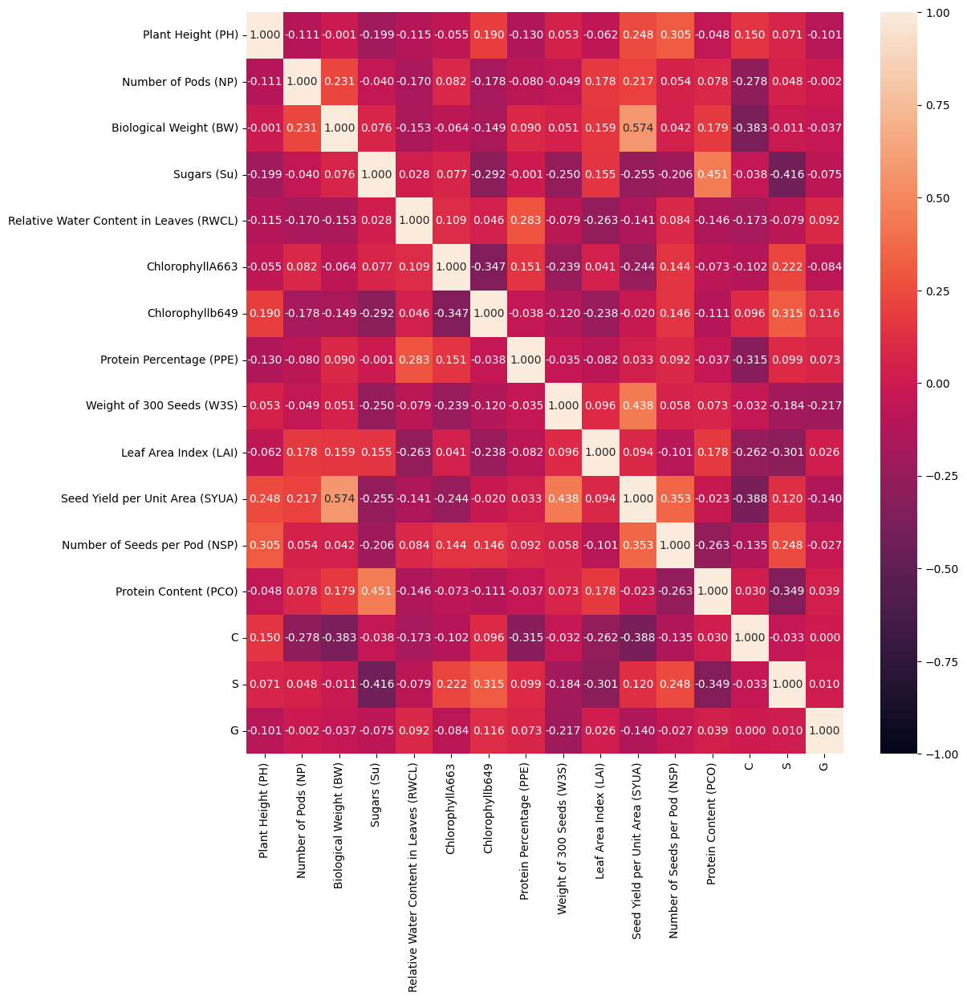

In [20]:
plt.figure(figsize=(12,12))
sns.heatmap(data_v1.corr(),annot=True,fmt=".3f",vmax=1,vmin=-1)

/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector,

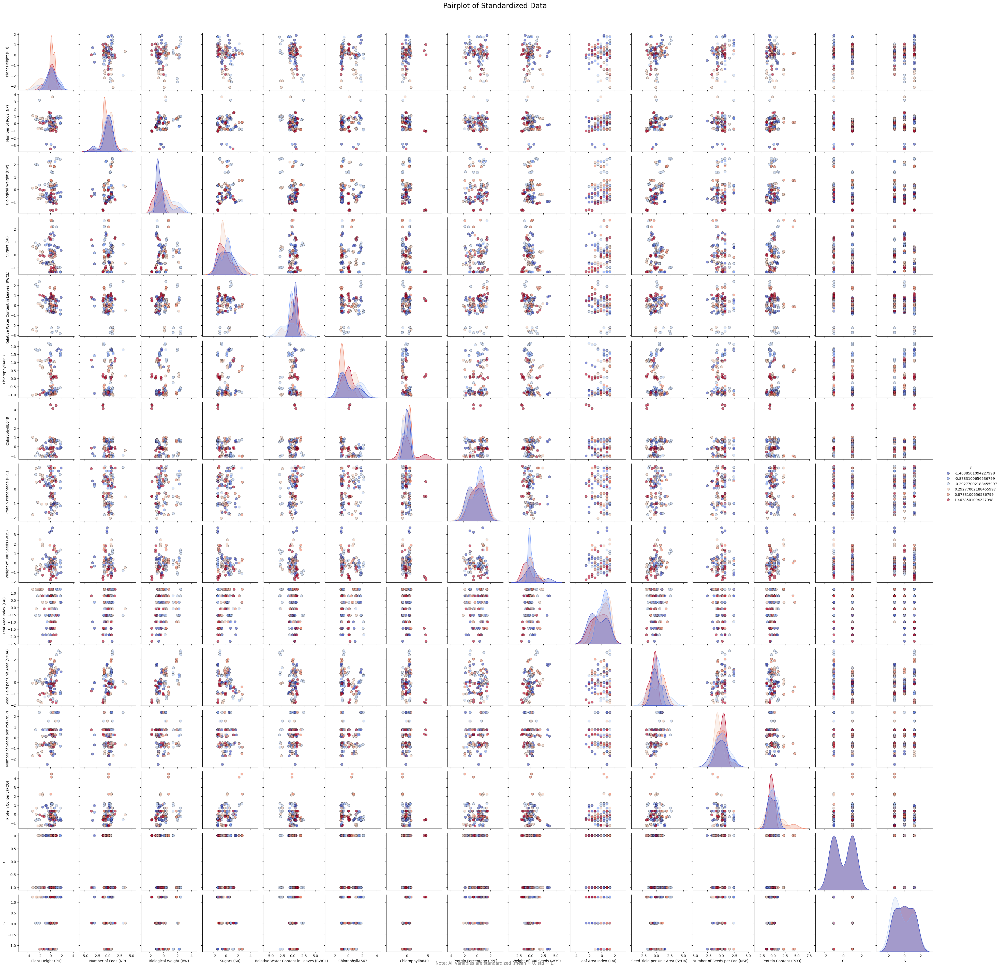

In [21]:
pairplot = sns.pairplot(data_v2,
                        kind="scatter",
                        diag_kind="kde",
                        plot_kws={'alpha': 0.6, 's': 50, 'edgecolor': 'k'},
                        diag_kws={'shade': True, 'color': 'purple'},
                        palette='coolwarm',hue='G')


pairplot.fig.suptitle('Pairplot of Standardized Data',
                      fontsize=20,
                      y=1.02)


plt.figtext(0.5, 0.01,
            'Note: All variables are standardized (mean = 0, std = 1)',
            wrap=True,
            horizontalalignment='center',
            fontsize=12,
            color='gray')

plt.show()

<Figure size 1200x1200 with 0 Axes>

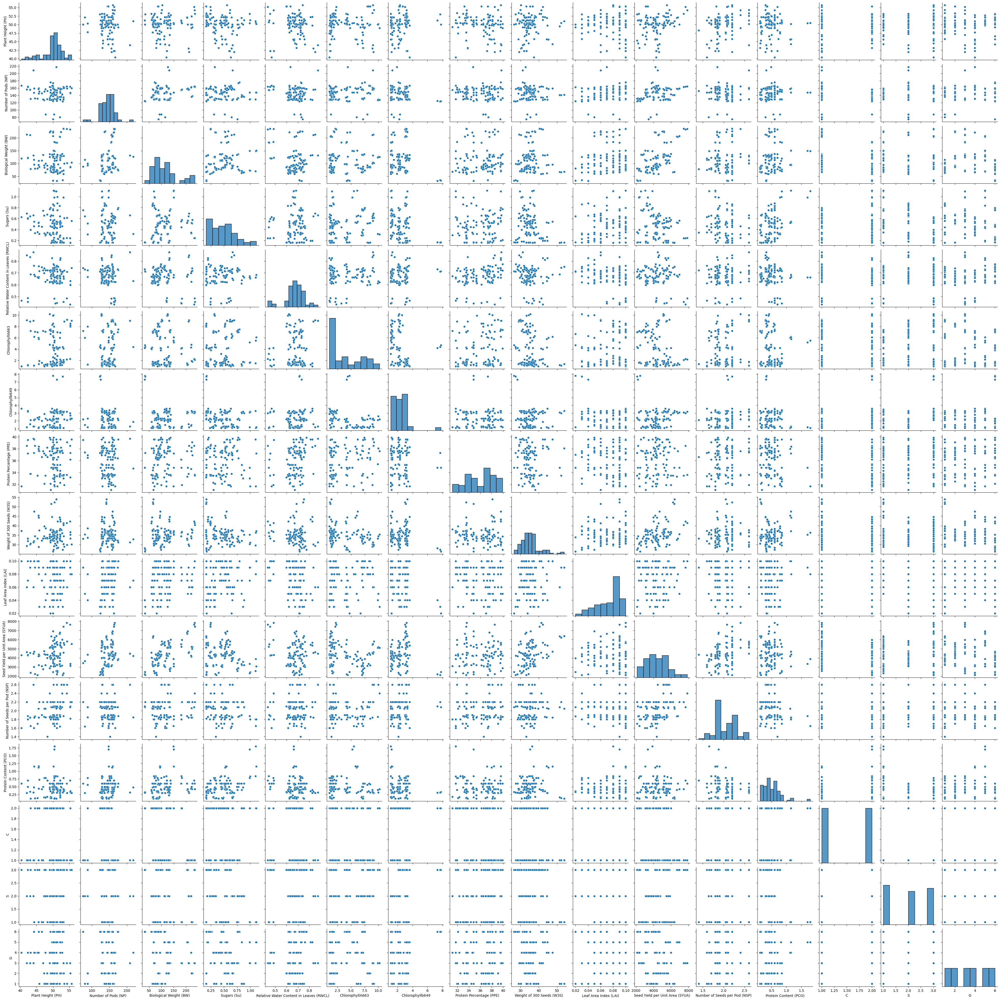

In [ ]:
plt.figure(figsize=(12,12))
sns.pairplot(data_v1)
plt.show()

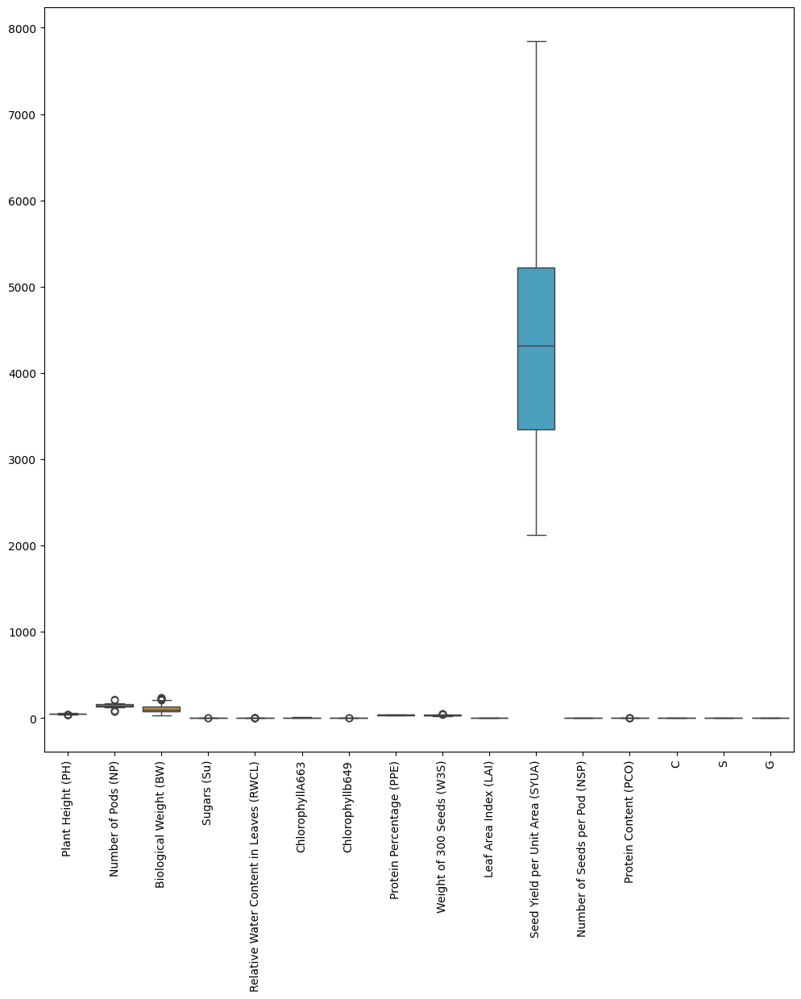

In [ ]:
plt.figure(figsize=(12,12))
sns.boxplot(data=data_v1)
plt.xticks(rotation=90)
plt.show()

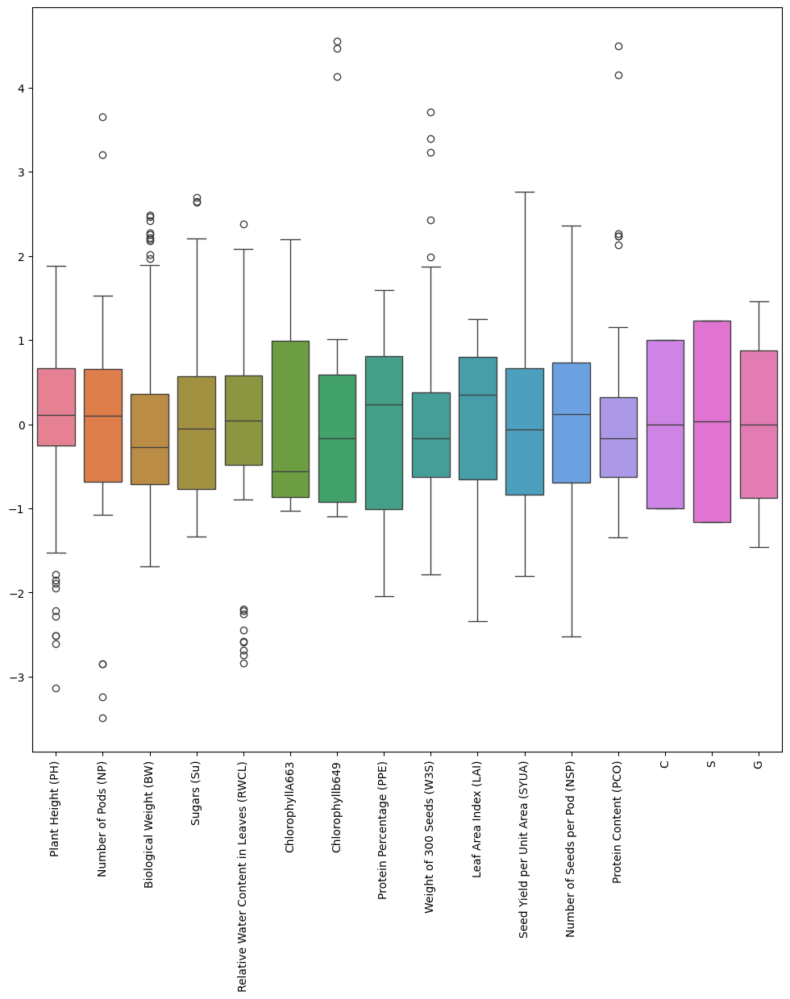

In [ ]:
plt.figure(figsize=(12,12))
sns.boxplot(data=data_v2)
plt.xticks(rotation=90)
plt.show()

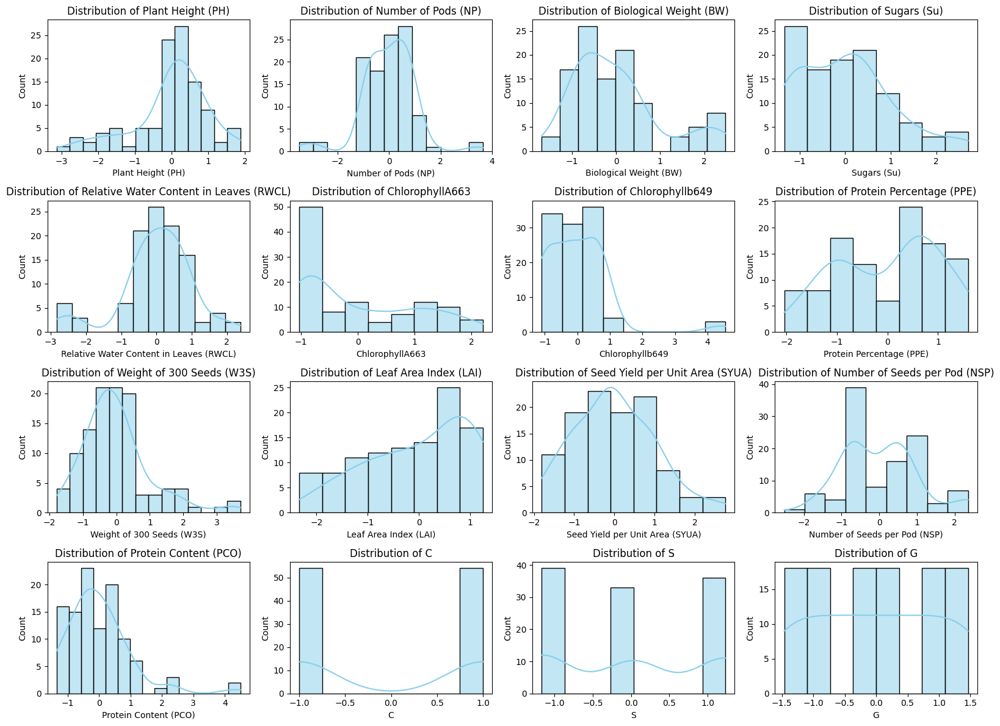

In [22]:
num_cols = data_v2.select_dtypes(include=np.number).columns.tolist()

plt.figure(figsize=(16, 12))
for idx, col in enumerate(num_cols):
    plt.subplot(4, 4, idx+1)
    sns.histplot(data_v2[col], kde=True, color='skyblue')
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

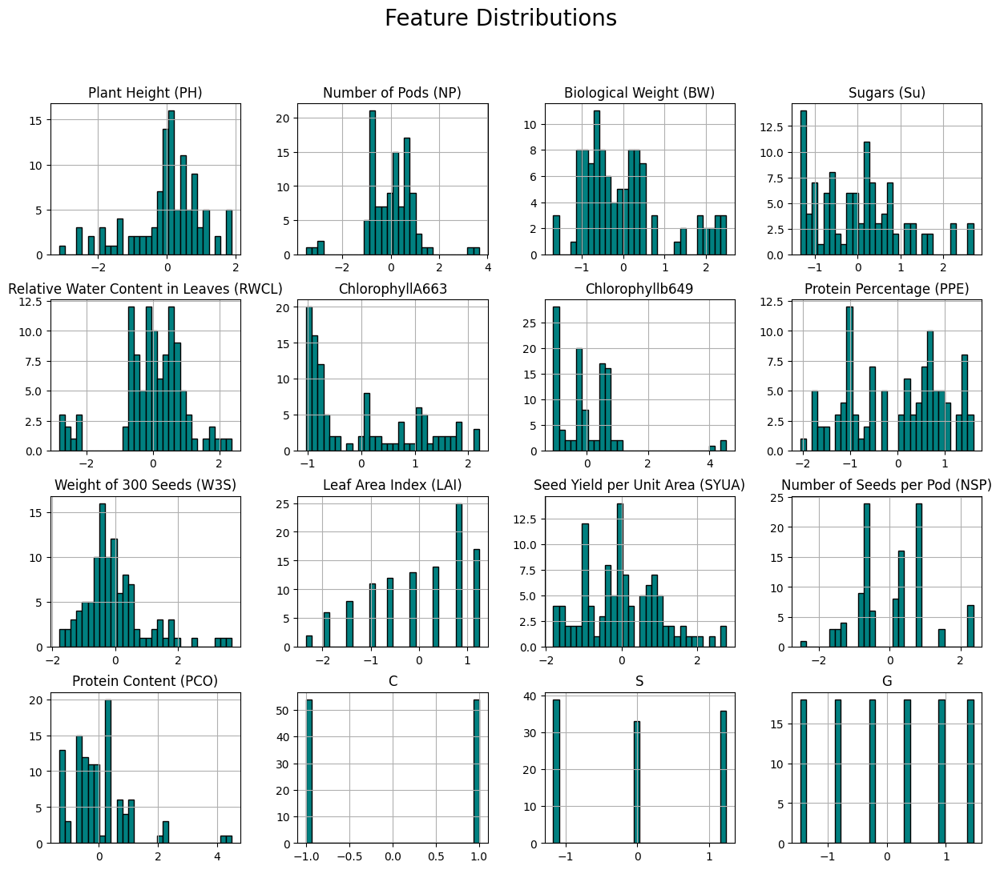

In [24]:
data_v2.hist(figsize=(15, 12), bins=30, color='teal', edgecolor='black')
plt.suptitle('Feature Distributions', fontsize=20)
plt.show()

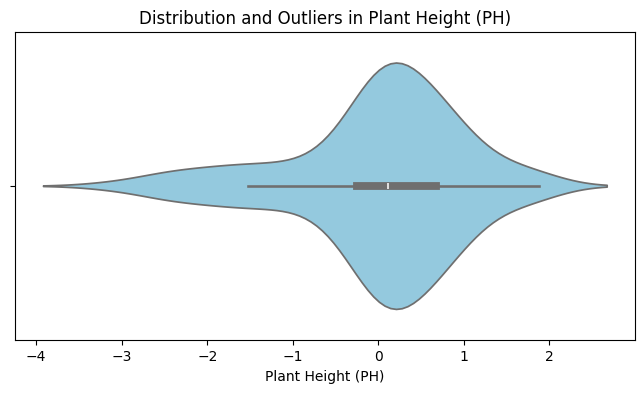

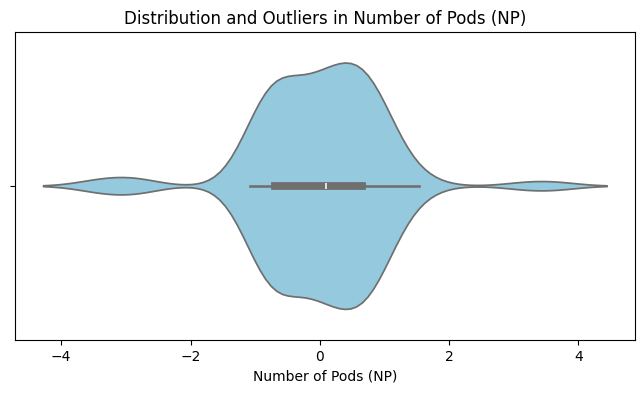

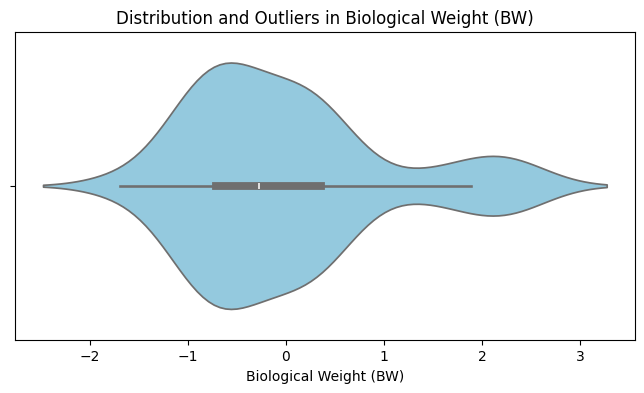

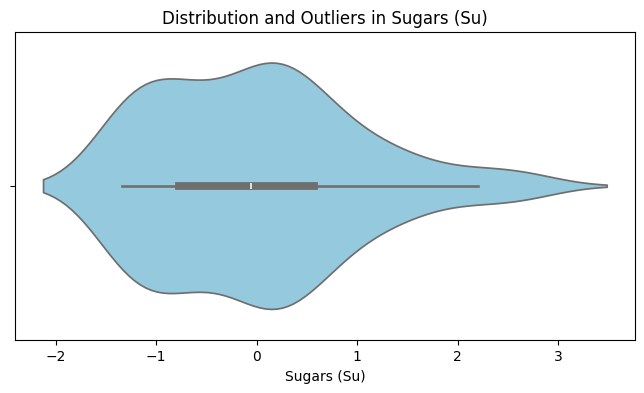

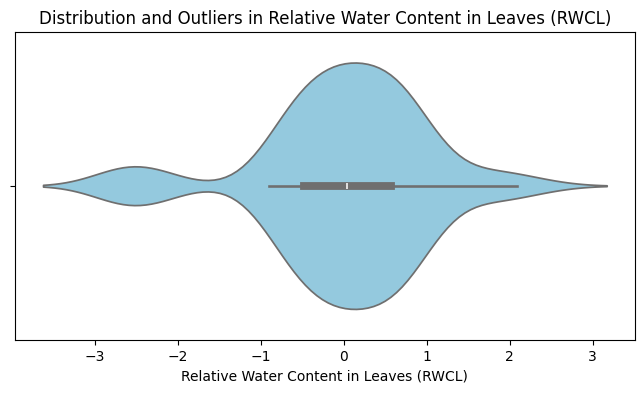

...

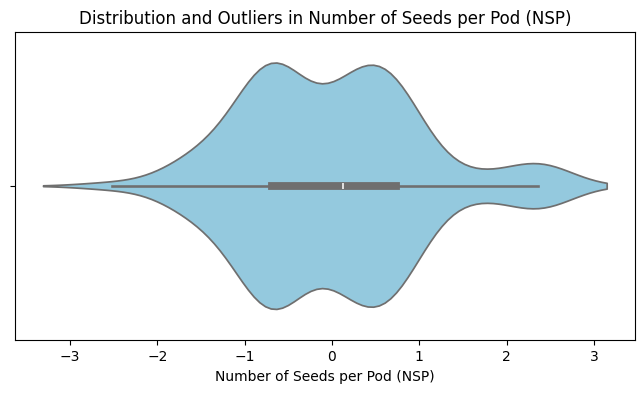

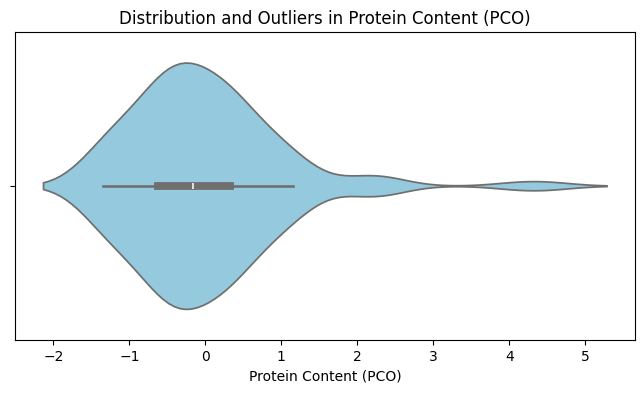

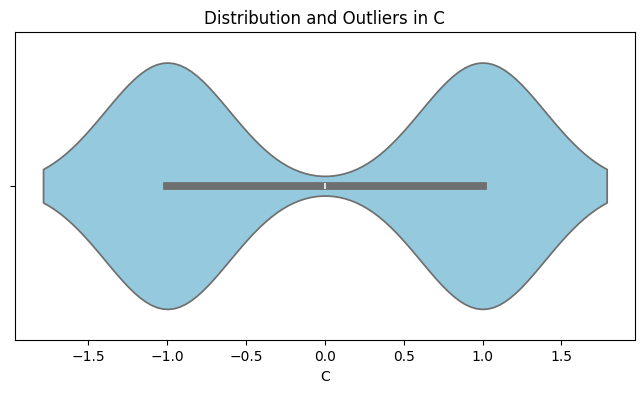

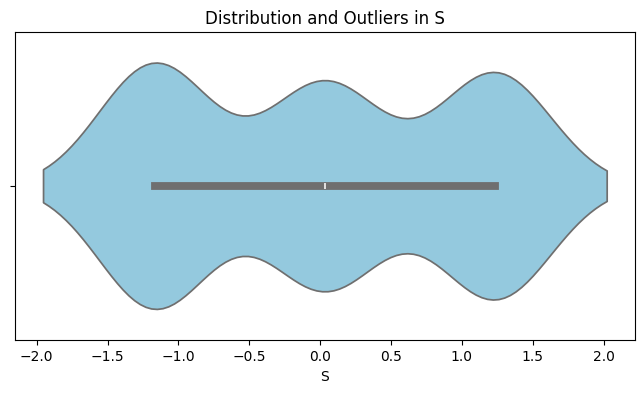

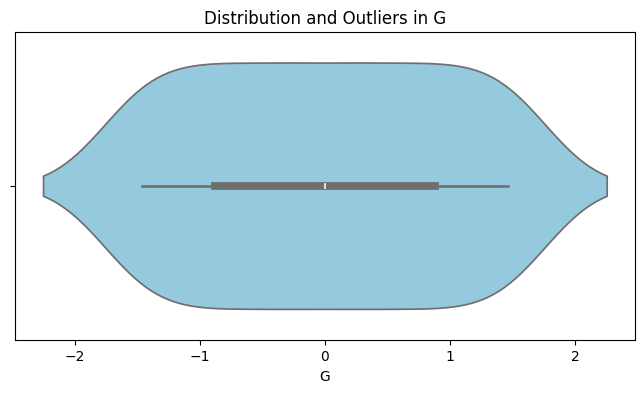

In [26]:
for col in data_v2.columns:
    plt.figure(figsize=(8, 4))
    sns.violinplot(x=data_v2[col], color='skyblue')
    plt.title(f'Distribution and Outliers in {col}')
    plt.show()

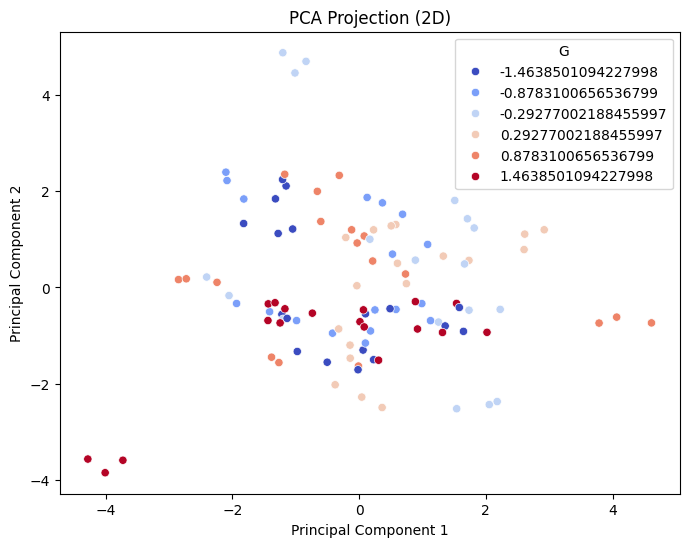

In [31]:
pca = PCA(n_components=2)
components = pca.fit_transform(data_v2)

plt.figure(figsize=(8,6))
sns.scatterplot(x=components[:,0], y=components[:,1], hue=data_v2['G'], palette="coolwarm")
plt.title('PCA Projection (2D)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

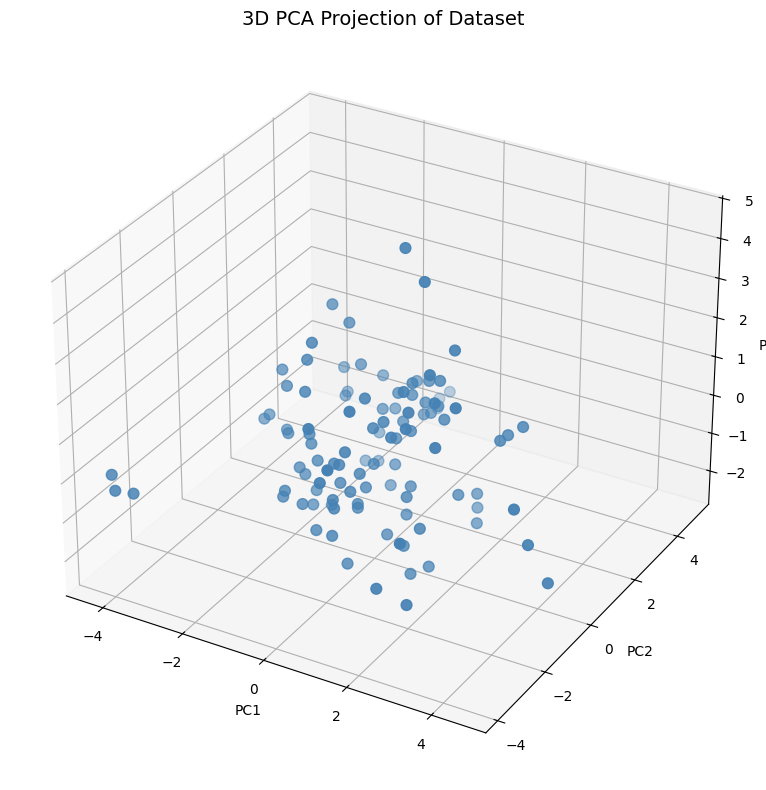

In [28]:
pca = PCA(n_components=3)
pca_3d = pca.fit_transform(data_v2)

# Create the 3D plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# # If clusters are available, color by them
# if 'Cluster' in data_v2.columns:
#     scatter = ax.scatter(pca_3d[:, 0], pca_3d[:, 1], pca_3d[:, 2],
#                          c=data_v2['G'], cmap='viridis', s=60)
#     # legend = ax.legend(*scatter.legend_elements(), title="Clusters")
#     ax.add_artist(legend)
# else:
    ax.scatter(pca_3d[:, 0], pca_3d[:, 1], pca_3d[:, 2], color='steelblue', s=60)

ax.set_title("3D PCA Projection of Dataset", fontsize=14)
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
plt.tight_layout()
plt.show()

#Since there are very less data points(108), we won't be removing OUTLIERS but we can try removing them and doing all the further analysis and training at a later stage again

<BarContainer object of 108 artists>

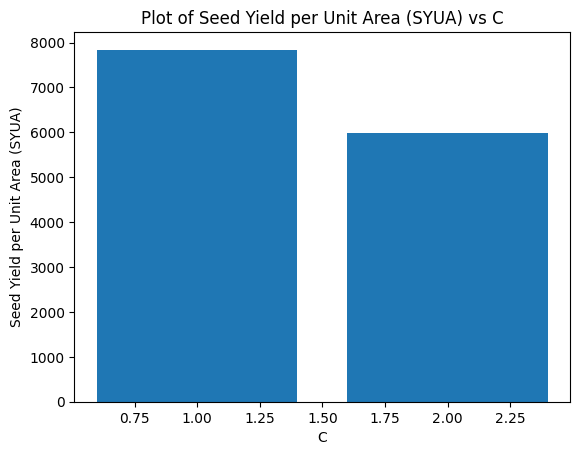

In [ ]:
plt.title("Plot of Seed Yield per Unit Area (SYUA) vs C")
plt.xlabel("C")
plt.ylabel("Seed Yield per Unit Area (SYUA)")
plt.bar(data_v1["C"],data_v1["Seed Yield per Unit Area (SYUA)"])

<BarContainer object of 108 artists>

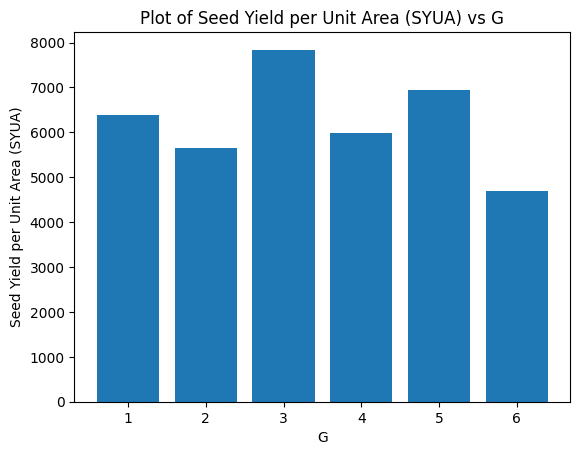

In [ ]:
plt.title("Plot of Seed Yield per Unit Area (SYUA) vs G")
plt.xlabel("G")
plt.ylabel("Seed Yield per Unit Area (SYUA)")
plt.bar(data_v1["G"],data_v1["Seed Yield per Unit Area (SYUA)"])

<BarContainer object of 108 artists>

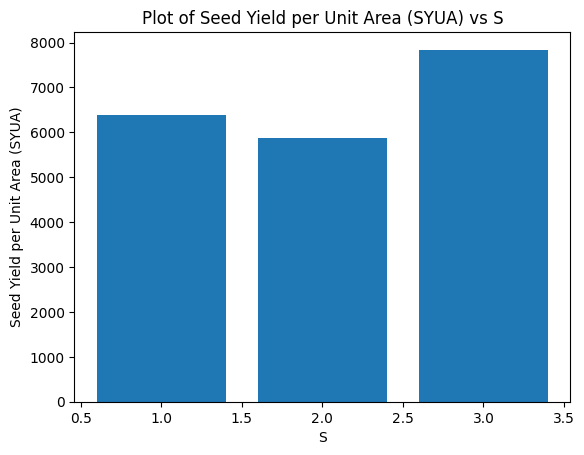

In [ ]:
plt.title("Plot of Seed Yield per Unit Area (SYUA) vs S")
plt.xlabel("S")
plt.ylabel("Seed Yield per Unit Area (SYUA)")
plt.bar(data_v1["S"],data_v1["Seed Yield per Unit Area (SYUA)"])

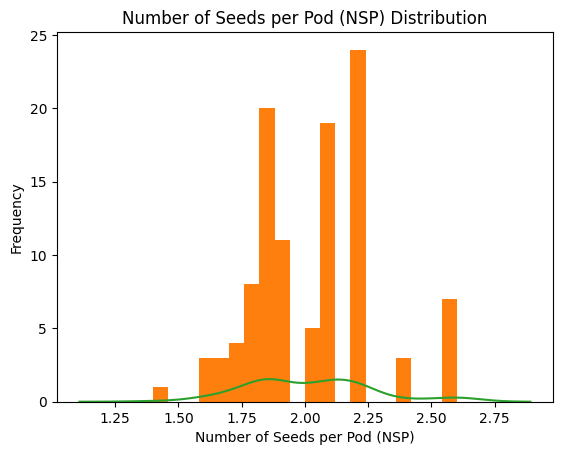

In [ ]:
data_v1['Number of Seeds per Pod (NSP)'].plot(kind='hist', bins=20, title='Number of Seeds per Pod (NSP) Distribution')
plt.hist(data_v1['Number of Seeds per Pod (NSP)'],bins=20)
sns.kdeplot(data_v1['Number of Seeds per Pod (NSP)'])
plt.xlabel('Number of Seeds per Pod (NSP)')
plt.show()

# **Mutual Information Regression between plausible target variables and other variables**

Plausible target variables are :


*   Seed Yield Per Unit Area
*   Number of Seeds per pod
*   Sugars
*   Protein Percentage







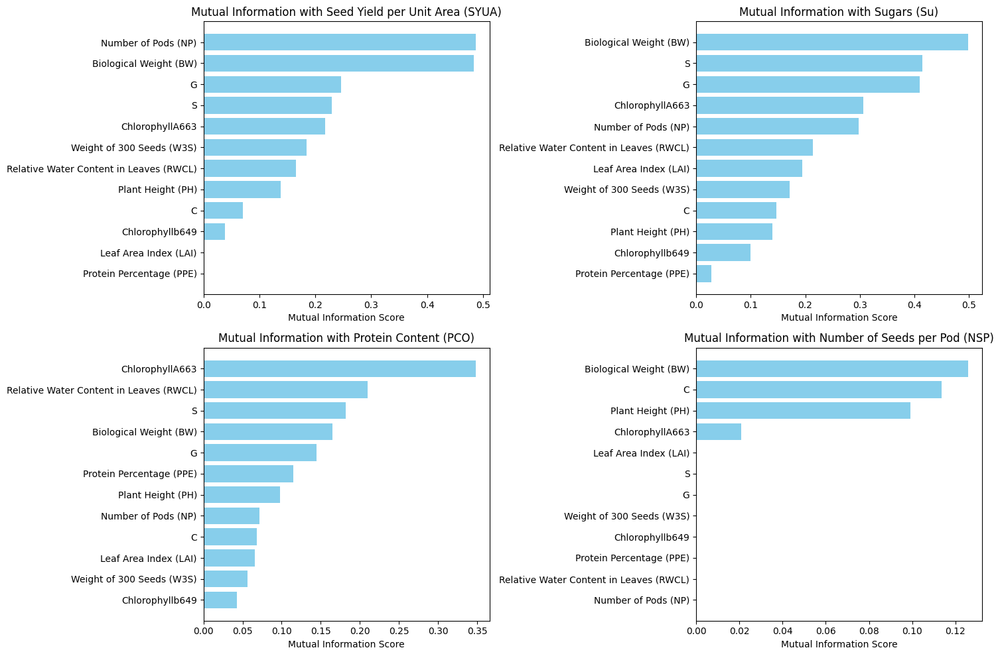

In [ ]:
target_vars = ["Seed Yield per Unit Area (SYUA)", "Sugars (Su)", "Protein Content (PCO)", "Number of Seeds per Pod (NSP)"]
target_frame=data_v2[target_vars]
features = data_v2.drop(columns=target_vars)

# Compute Mutual Information for each target variable
mi_scores = {}
for target in target_vars:
    mi = mutual_info_regression(features, data_v2[target], random_state=42)
    mi_scores[target] = mi

# Plot bar graphs
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()

for i, target in enumerate(target_vars):
    sorted_indices = np.argsort(mi_scores[target])[::-1]
    sorted_features = features.columns[sorted_indices]
    sorted_mi = np.array(mi_scores[target])[sorted_indices]

    axes[i].barh(sorted_features, sorted_mi, color='skyblue')
    axes[i].set_title(f"Mutual Information with {target}")
    axes[i].set_xlabel("Mutual Information Score")
    axes[i].invert_yaxis()

plt.tight_layout()
plt.show()

In [ ]:
data_v2.columns

Index(['Plant Height (PH)', 'Number of Pods (NP)', 'Biological Weight (BW)',
       'Sugars (Su)', 'Relative Water Content in Leaves (RWCL)',
       'ChlorophyllA663', 'Chlorophyllb649', 'Protein Percentage (PPE)',
       'Weight of 300 Seeds (W3S)', 'Leaf Area Index (LAI)',
       'Seed Yield per Unit Area (SYUA)', 'Number of Seeds per Pod (NSP)',
       'Protein Content (PCO)', 'C', 'S', 'G'],
      dtype='object')

# **Clustering Techniques**

## Clustering is performed on the whole dataset to identify which set of inputs and outputs will give the maximum yield

## Clustering is also performed on the output parameters to identify which set of phenotypic traits can be obtained from the seeds - qualitative clustering of phenotypes

# Using the KMeans Clustering Algorithm to cluster data on the PCA(2) dataset

In [ ]:
pca=PCA(n_components=2)
params=data_v2.columns
pca_data=pd.DataFrame(pca.fit_transform(data_v2[params]),columns=["PC1","PC2"])
pca_data

,PC1,PC2
0,0.732307,0.278651
1,-0.378193,-2.023648
2,0.013469,-0.713336
3,-1.152673,2.109208
4,1.537550,-0.333274
...,...,...
103,0.169585,1.001822
104,-2.102698,2.395347
105,3.787550,-0.741049
106,-0.322685,-0.863335


## Using Silhoutte score & Elbow score using inertia as a means for checking effectiveness of clustering algorithm

In [ ]:
params={'n_clusters':range(2,20)}
best_score=-1
best_k=1
best_model=''

inertia_values=[]

divide=int(len(pca_data)*0.8)
pca_data_train,pca_data_test=pd.DataFrame(pca_data[:divide]),pd.DataFrame(pca_data[divide:])

for parameter in ParameterGrid(params):
  kmeans_model=KMeans(n_clusters=parameter['n_clusters'])
  kmeans_model.fit(pca_data_train)
  predicted_val=kmeans_model.predict(pca_data_test)
  score=silhouette_score(pca_data_test,predicted_val)
  inertia_values.append(kmeans_model.inertia_)

  # if(score>best_score):
  #   best_k=parameter['n_clusters']
  #   best_score=score
  #   best_model=kmeans_model
  print(parameter,score)



{'n_clusters': 2} 0.3509700818244119
{'n_clusters': 3} 0.29259057648452574
{'n_clusters': 4} 0.29724556775285693
{'n_clusters': 5} 0.25599183782737794
{'n_clusters': 6} 0.29778436698545546
{'n_clusters': 7} 0.07500594328712165
{'n_clusters': 8} 0.21011513333111315
{'n_clusters': 9} 0.215421711985019
{'n_clusters': 10} 0.3336439926760866
{'n_clusters': 11} 0.2061361716025244
{'n_clusters': 12} 0.25163731736089195
{'n_clusters': 13} 0.2985315938142446
{'n_clusters': 14} 0.3911265157249339
{'n_clusters': 15} 0.13386983696582208
{'n_clusters': 16} 0.29968939409033585
{'n_clusters': 17} 0.2105139081855918
{'n_clusters': 18} 0.14334822404916184
{'n_clusters': 19} 0.17755626607079542


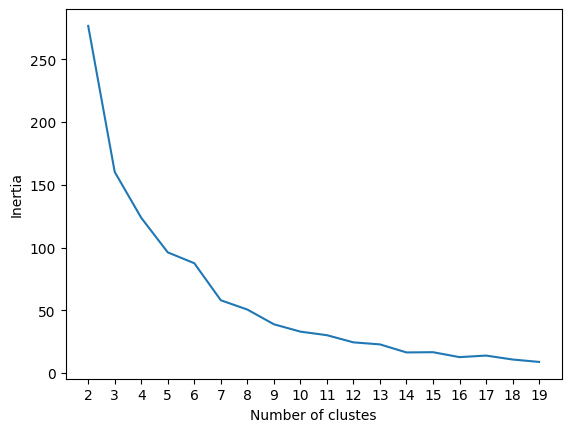

In [ ]:
elbow_scores=pd.DataFrame({"K":range(2,20),"Inertia":inertia_values})
sns.lineplot(data=elbow_scores,x="K",y="Inertia")
plt.xlabel("Number of clustes")
plt.ylabel("Inertia")
plt.xticks(range(2,20))
plt.show()

# Elbow point observed to be between 5,6 and 7

# 6-Cluster model

In [ ]:
kmeans_model_6=KMeans(n_clusters=6)
kmeans_model_6.fit(pca_data_train)

KMeans(n_clusters=6)

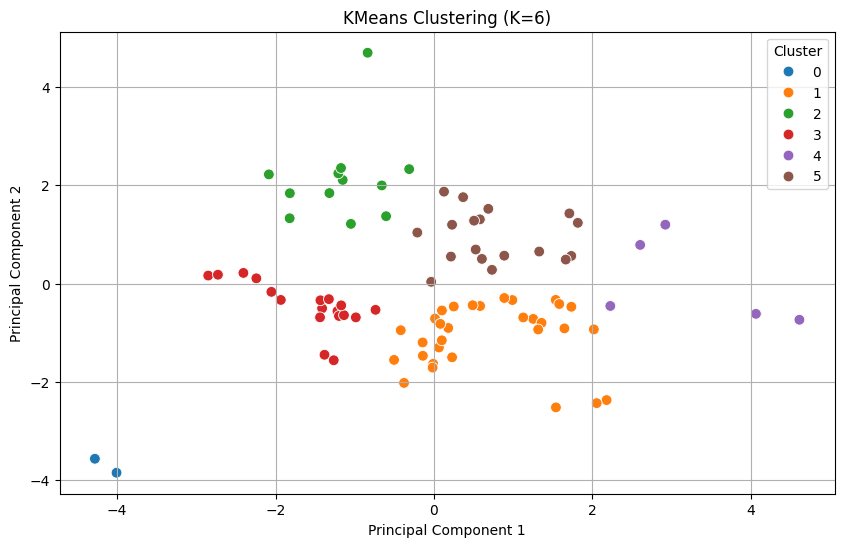

In [ ]:
##plot showing clusters for train data
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_data_train, x='PC1', y='PC2', hue=kmeans_model_6.labels_, palette='tab10', s=60)
plt.title(f'KMeans Clustering (K={6})')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

In [ ]:
predicted_val=kmeans_model_6.predict(pca_data_test)
pca_data_test["cluster"]=predicted_val
score=silhouette_score(pca_data_test,predicted_val)
inertia_values.append(kmeans_model_6.inertia_)

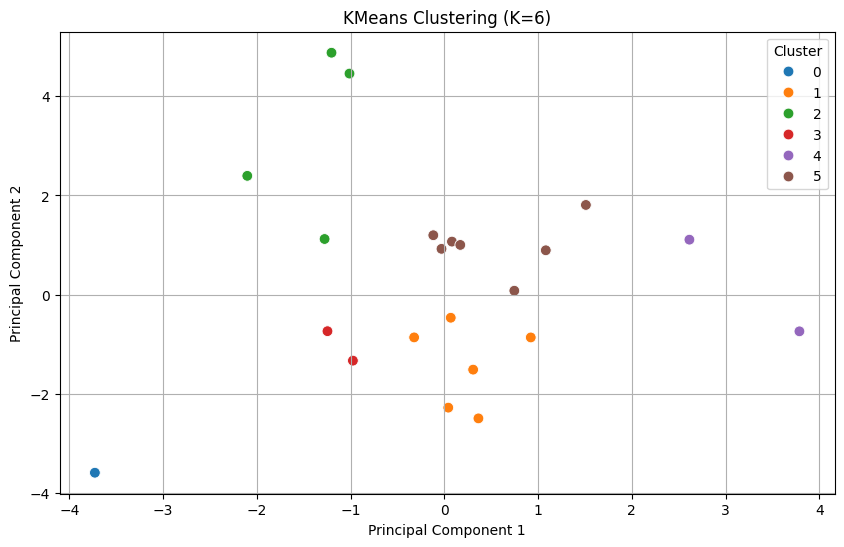

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_data_test, x='PC1', y='PC2', hue='cluster', palette='tab10', s=60)
plt.title(f'KMeans Clustering (K={6})')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

In [ ]:
predicted_val=kmeans_model_6.predict(pca_data)
pca_data1=pd.DataFrame(pca_data)
pca_data1["cluster"]=predicted_val
score=silhouette_score(pca_data1,predicted_val)
inertia_values.append(kmeans_model.inertia_)

print(f"Sillouhette score {score}")

Sillouhette score 0.5987616351690875


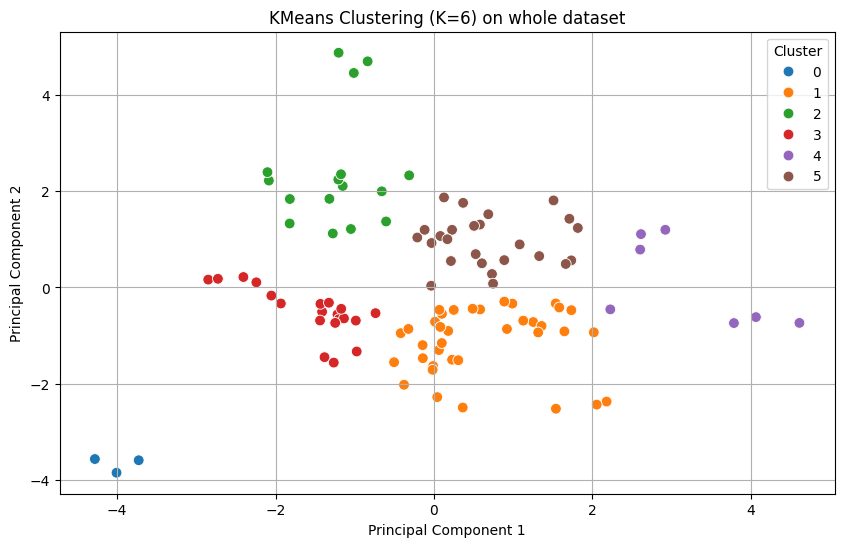

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_data1, x='PC1', y='PC2', hue='cluster', palette='tab10', s=60)
plt.title(f'KMeans Clustering (K={6}) on whole dataset')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

# 5 Component cluster

In [ ]:
k=5
kmeans_model_5=KMeans(n_clusters=k)
kmeans_model_5.fit(pca_data_train)

KMeans(n_clusters=5)

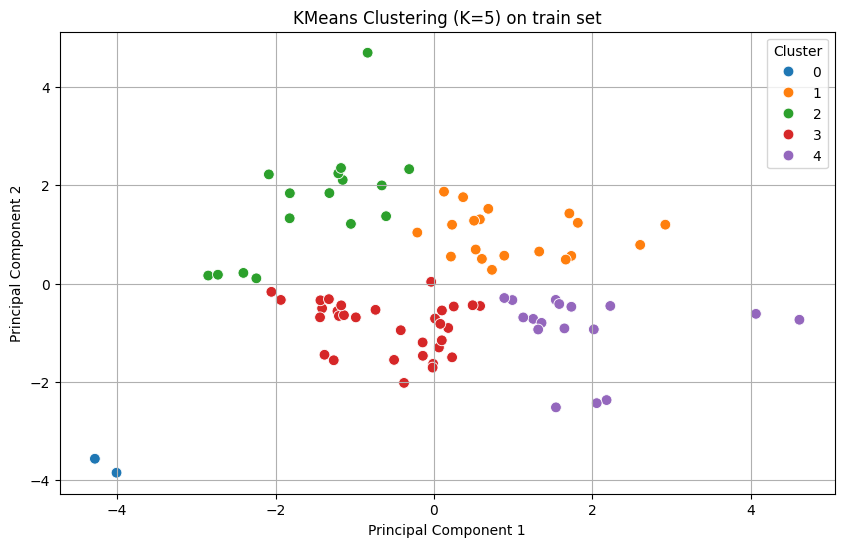

In [ ]:
##kmean clusterring on train data
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_data_train, x='PC1', y='PC2', hue=kmeans_model_5.labels_, palette='tab10', s=60)
plt.title(f'KMeans Clustering (K={k}) on train set')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

In [ ]:
pca_data_test=pca_data_test.drop(columns=["cluster"])
# pca_data_test

In [ ]:
predicted_val=kmeans_model_5.predict(pca_data_test)
pca_data_test["cluster"]=predicted_val
score=silhouette_score(pca_data_test,predicted_val)
inertia_values.append(kmeans_model_5.inertia_)

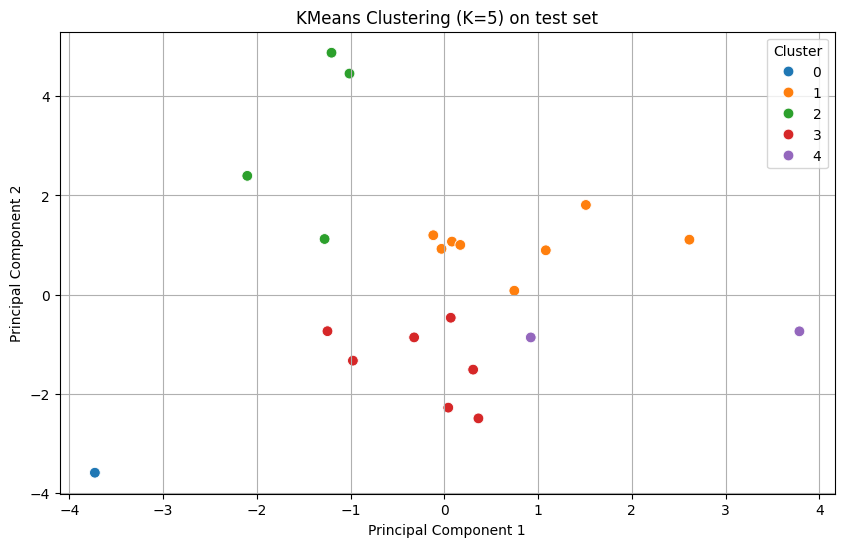

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_data_test, x='PC1', y='PC2', hue='cluster', palette='tab10', s=60)
plt.title(f'KMeans Clustering (K={k}) on test set')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

In [ ]:
predicted_val=kmeans_model_5.predict(pca_data)
pca_data1=pd.DataFrame(pca_data)
pca_data1["cluster"]=predicted_val
score=silhouette_score(pca_data1,predicted_val)
inertia_values.append(kmeans_model_5.inertia_)

print(f"Sillouhette score {score}")

Sillouhette score 0.5106936443348776


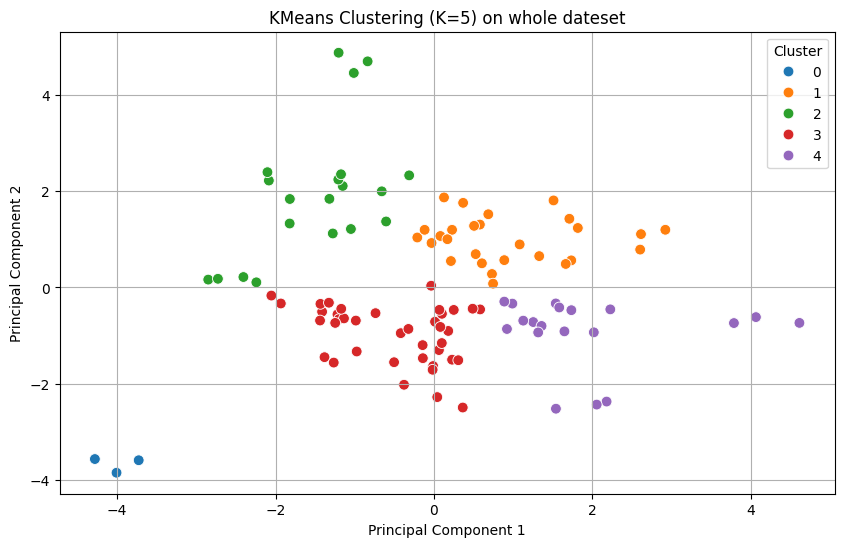

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_data1, x='PC1', y='PC2', hue='cluster', palette='tab10', s=60)
plt.title(f'KMeans Clustering (K={k}) on whole dateset')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

# 7 Component cluster

In [ ]:
k=7
kmeans_model_7=KMeans(n_clusters=k)
kmeans_model_7.fit(pca_data_train)

KMeans(n_clusters=7)

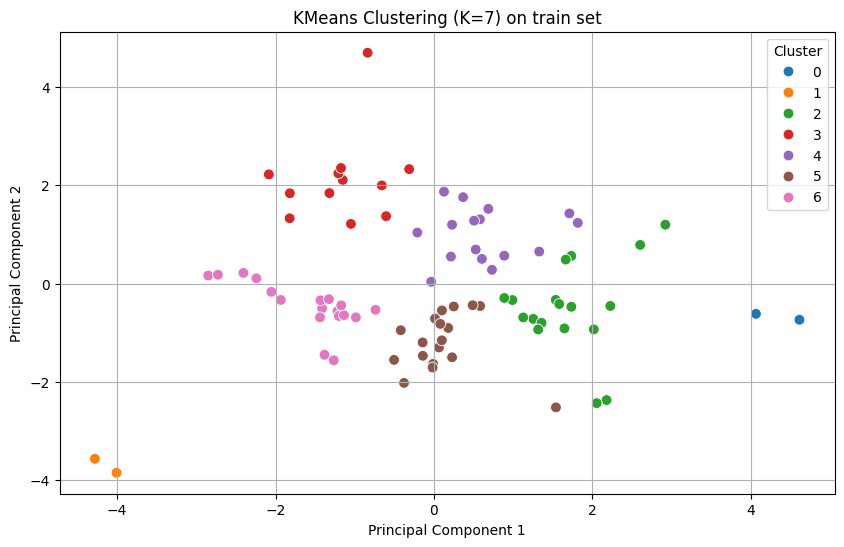

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_data_train, x='PC1', y='PC2', hue=kmeans_model_7.labels_, palette='tab10', s=60)
plt.title(f'KMeans Clustering (K={k}) on train set')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

In [ ]:
pca_data_test=pca_data_test.drop(columns=["cluster"])
# pca_data_test

In [ ]:
predicted_val=kmeans_model_7.predict(pca_data_test)
pca_data_test["cluster"]=predicted_val
score=silhouette_score(pca_data_test,predicted_val)
inertia_values.append(kmeans_model_7.inertia_)

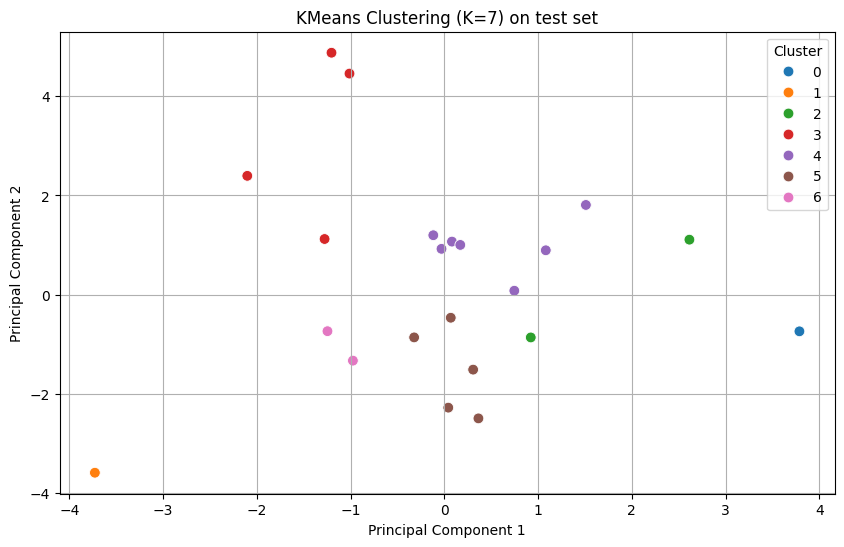

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_data_test, x='PC1', y='PC2', hue='cluster', palette='tab10', s=60)
plt.title(f'KMeans Clustering (K={7}) on test set')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

In [ ]:
predicted_val=kmeans_model_7.predict(pca_data)
pca_data1=pd.DataFrame(pca_data)
pca_data1["cluster"]=predicted_val
score=silhouette_score(pca_data1,predicted_val)
inertia_values.append(kmeans_model_7.inertia_)

print(f"Sillouhette score {score}")

Sillouhette score 0.5586117588569093


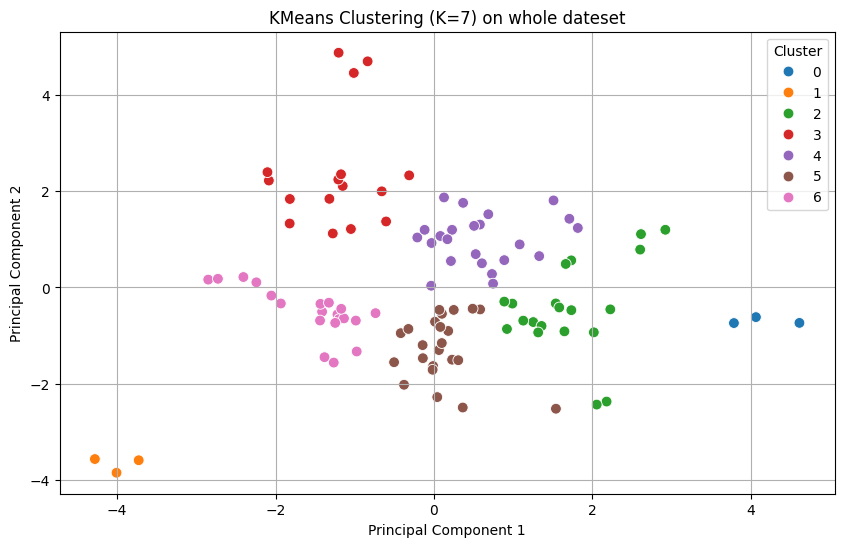

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_data1, x='PC1', y='PC2', hue='cluster', palette='tab10', s=60)
plt.title(f'KMeans Clustering (K={k}) on whole dateset')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

# **6 Clusters on Tsne-2 data**

In [ ]:
#applying TSNE on whole dataSet
from sklearn.manifold import TSNE
import pandas as pd

tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, random_state=42)
tsne_data = pd.DataFrame(tsne.fit_transform(data_v2), columns=["PC1", "PC2"]).astype('float64')

In [ ]:
k=6
kmeans_model_6_tsne=KMeans(n_clusters=k)
kmeans_model_6_tsne.fit(tsne_data)
predicted_val=kmeans_model_6_tsne.predict(tsne_data)
score=silhouette_score(pca_data1,predicted_val)
print(f"Inertia value for tsne-2 data is {kmeans_model_6_tsne.inertia_}")
print(f"Sillouhette score {score}")

Inertia value for tsne-2 data is 934.6500841621404
Sillouhette score 0.006166614951145522


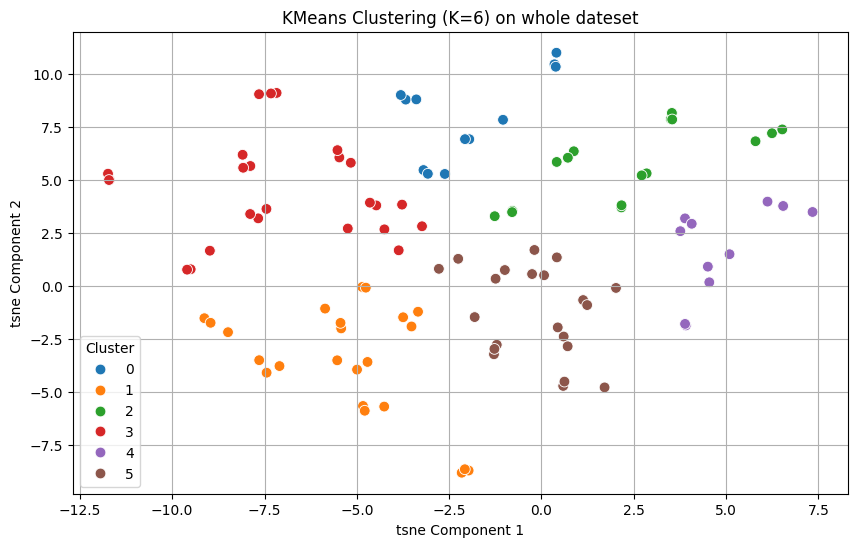

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_data, x='PC1', y='PC2', hue=predicted_val, palette='tab10', s=60)
plt.title(f'KMeans Clustering (K={k}) on whole dateset')
plt.xlabel('tsne Component 1')
plt.ylabel('tsne Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

# **Evaluating Clustering models that have been made so far**



*   5-Cluster Model on PCA-2
*   6-Cluster Model on PCA-2
*   7-Cluster Model on PCA-3
*   6-Cluster Model on TSNE dataset

## Evaluation criterion used
*   Silhoutte Scores
*   David Bouldin score
*   Calinski harabasz score








In [ ]:
pca_data
pca_data=pca_data.astype('double')
pca_data.dtypes

,0
PC1,float64
PC2,float64


In [ ]:
models=[kmeans_model_5,kmeans_model_6,kmeans_model_7,kmeans_model_6_tsne]
models_name=['5-Cluster Model','6-Cluster Model','7-Cluster-Model','6-Cluster-tSNE model']
silhouette_scores=[]
davies_bouldin_scores=[]
calinski_harabasz_scores=[]
adjusted_rand_scores=[]
data_clustered=pd.DataFrame(data_v2)

for model in models:
  # print(silhouette_scores)
  labels=model.predict(pca_data)
  silhouette_scores.append(silhouette_score(pca_data,labels))
  davies_bouldin_scores.append(davies_bouldin_score(pca_data,labels))
  calinski_harabasz_scores.append(calinski_harabasz_score(pca_data,labels))
  data_clustered[f"cluster_label_{str(models_name[models.index(model)])}"]=labels

metrics=pd.DataFrame({
    "Silhoutte Score":silhouette_scores,
    "David Bouldin Score":davies_bouldin_scores,
    "Calinski Harabasz Score":calinski_harabasz_scores
    })
metrics.index=models_name
metrics

,Silhoutte Score,David Bouldin Score,Calinski Harabasz Score
5-Cluster Model,0.415743,0.733085,73.859008
6-Cluster Model,0.420607,0.676405,85.373051
7-Cluster-Model,0.424823,0.687614,84.186591
6-Cluster-tSNE model,0.298867,0.591892,20.576571


# Visualizing performance metrics of clustering

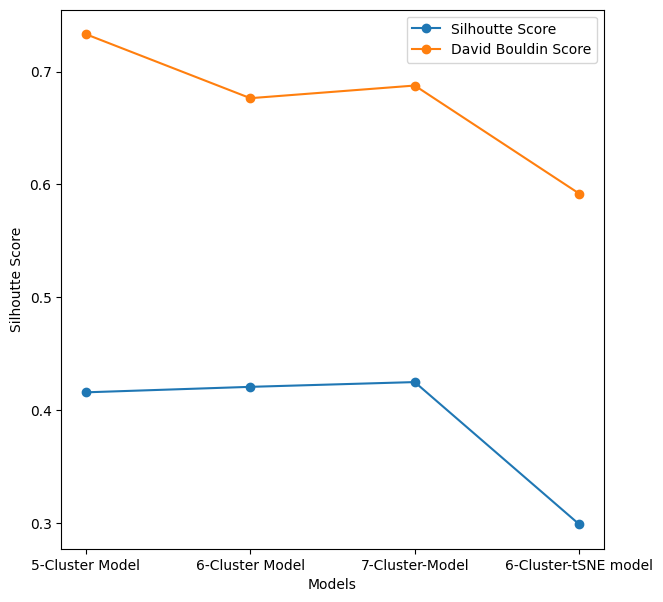

In [ ]:
plt.figure(figsize=(7, 7))
plt.plot(metrics.index,metrics["Silhoutte Score"],label="Silhoutte Score",marker='o')
plt.plot(metrics.index,metrics["David Bouldin Score"],label="David Bouldin Score",marker='o')
plt.xlabel('Models')
plt.ylabel('Silhoutte Score')
plt.legend()
plt.show()

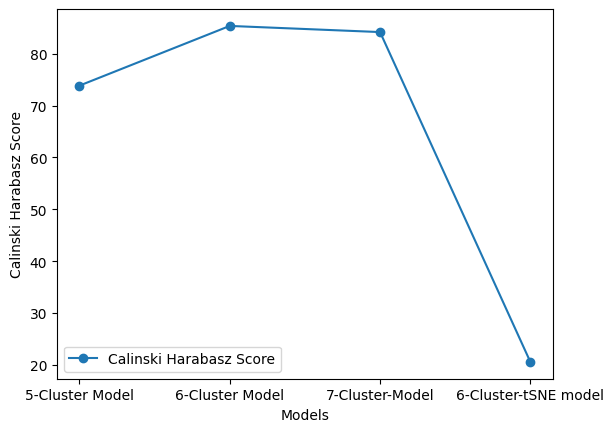

In [ ]:
plt.plot(metrics.index,metrics["Calinski Harabasz Score"],label="Calinski Harabasz Score",marker='o')
plt.xlabel('Models')
plt.ylabel('Calinski Harabasz Score')
plt.legend()
plt.show()

In [ ]:
data_clustered

,Plant Height (PH),Number of Pods (NP),Biological Weight (BW),Sugars (Su),Relative Water Content in Leaves (RWCL),ChlorophyllA663,Chlorophyllb649,Protein Percentage (PPE),Weight of 300 Seeds (W3S),Leaf Area Index (LAI),Seed Yield per Unit Area (SYUA),Number of Seeds per Pod (NSP),Protein Content (PCO),C,S,G,cluster_label_5-Cluster Model,cluster_label_6-Cluster Model,cluster_label_7-Cluster-Model,cluster_label_6-Cluster-tSNE model
0,0.177164,-0.731058,-0.072110,-0.188523,0.690705,-0.891630,0.590306,-1.175971,-0.349841,0.353251,0.942116,-0.651063,1.086519,-1.0,-1.167315,0.87831,1,5,4,5
1,-1.788630,-0.646145,-0.705770,-0.607499,0.004383,1.110878,-0.167656,1.016621,-0.189829,0.802088,-1.712383,-0.610395,-1.313226,1.0,1.234019,0.29277,3,1,5,5
2,0.734139,0.252936,-0.644448,0.052705,0.039882,-0.751103,-0.925618,-1.010492,-0.029817,-0.095586,-0.049316,0.080959,-1.243668,1.0,-1.167315,1.46385,3,1,5,5
3,0.177164,-0.206594,-0.991938,-1.331185,0.844535,-0.997025,0.506088,-1.051862,3.390443,0.802088,1.459208,0.731646,-1.278447,-1.0,-1.167315,-1.46385,2,2,3,5
4,-0.248758,1.531628,-0.848854,1.343489,0.607873,1.251405,-0.251874,1.471688,-0.829878,1.250924,-0.392046,-0.569727,0.321383,-1.0,0.033352,1.46385,4,1,2,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,-1.952446,3.199922,0.357143,0.784855,2.382843,1.778380,-0.925618,1.513057,-0.829878,-0.544422,0.067351,2.358363,-0.652427,-1.0,0.033352,-0.29277,1,5,4,5
104,1.094535,0.752425,0.316262,-1.322721,-0.267779,-0.751103,0.674524,-1.010492,-0.169828,1.250924,1.003087,2.358363,-0.513311,-1.0,1.234019,-0.87831,2,2,3,5
105,0.078874,0.168023,0.745515,2.697754,0.110881,0.759561,-1.009836,0.478816,0.370213,1.250924,-1.055850,-0.895071,2.234223,1.0,-1.167315,0.87831,4,4,0,4
106,0.734139,0.552629,-0.991938,-0.772550,-0.492609,1.040614,-1.094054,-1.548298,-0.009816,0.802088,-1.019811,0.324967,-1.174110,1.0,0.033352,0.29277,3,1,5,5


In [ ]:
params=data_clustered.columns[:16]
params

Index(['Plant Height (PH)', 'Number of Pods (NP)', 'Biological Weight (BW)',
       'Sugars (Su)', 'Relative Water Content in Leaves (RWCL)',
       'ChlorophyllA663', 'Chlorophyllb649', 'Protein Percentage (PPE)',
       'Weight of 300 Seeds (W3S)', 'Leaf Area Index (LAI)',
       'Seed Yield per Unit Area (SYUA)', 'Number of Seeds per Pod (NSP)',
       'Protein Content (PCO)', 'C', 'S', 'G'],
      dtype='object')

In [ ]:
data_clustered.corrwith(data_clustered["cluster_label_6-Cluster Model"])

,0
Plant Height (PH),-0.173968
Number of Pods (NP),0.274703
Biological Weight (BW),0.506074
Sugars (Su),-0.002452
Relative Water Content in Leaves (RWCL),-0.097667
ChlorophyllA663,0.051554
Chlorophyllb649,-0.248863
Protein Percentage (PPE),0.133039
Weight of 300 Seeds (W3S),0.179198
Leaf Area Index (LAI),0.113087


In [ ]:
# data_v1.columns

In [ ]:
data_v2.iloc[:,:-3]

,Plant Height (PH),Number of Pods (NP),Biological Weight (BW),Sugars (Su),Relative Water Content in Leaves (RWCL),ChlorophyllA663,Chlorophyllb649,Protein Percentage (PPE),Weight of 300 Seeds (W3S),Leaf Area Index (LAI),Seed Yield per Unit Area (SYUA),Number of Seeds per Pod (NSP),Protein Content (PCO)
0,0.177164,-0.731058,-0.072110,-0.188523,0.690705,-0.891630,0.590306,-1.175971,-0.349841,0.353251,0.942116,-0.651063,1.086519
1,-1.788630,-0.646145,-0.705770,-0.607499,0.004383,1.110878,-0.167656,1.016621,-0.189829,0.802088,-1.712383,-0.610395,-1.313226
2,0.734139,0.252936,-0.644448,0.052705,0.039882,-0.751103,-0.925618,-1.010492,-0.029817,-0.095586,-0.049316,0.080959,-1.243668
3,0.177164,-0.206594,-0.991938,-1.331185,0.844535,-0.997025,0.506088,-1.051862,3.390443,0.802088,1.459208,0.731646,-1.278447
4,-0.248758,1.531628,-0.848854,1.343489,0.607873,1.251405,-0.251874,1.471688,-0.829878,1.250924,-0.392046,-0.569727,0.321383
...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,-1.952446,3.199922,0.357143,0.784855,2.382843,1.778380,-0.925618,1.513057,-0.829878,-0.544422,0.067351,2.358363,-0.652427
104,1.094535,0.752425,0.316262,-1.322721,-0.267779,-0.751103,0.674524,-1.010492,-0.169828,1.250924,1.003087,2.358363,-0.513311
105,0.078874,0.168023,0.745515,2.697754,0.110881,0.759561,-1.009836,0.478816,0.370213,1.250924,-1.055850,-0.895071,2.234223
106,0.734139,0.552629,-0.991938,-0.772550,-0.492609,1.040614,-1.094054,-1.548298,-0.009816,0.802088,-1.019811,0.324967,-1.174110


**KMeans with only output parameters**

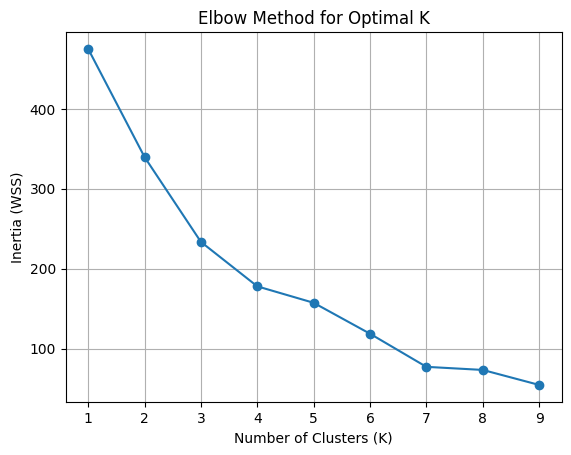

In [ ]:
#All the columns except partameters
X=data_v2.iloc[:,:-3]
pca=PCA(n_components=2)
X_pca=pca.fit_transform(X)
X_pca=pd.DataFrame(X_pca,columns=["pca1","pca2"])
inertia = []
K = range(1,10)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_pca)
    inertia.append(kmeans.inertia_)

# Plotting the Elbow Curve
plt.plot(K, inertia, marker='o')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia (WSS)')
plt.title('Elbow Method for Optimal K')
plt.grid(True)
plt.show()

K= 3
Inertia: 233.4377968502595
Silhouette Score: 0.33644419438140477
calinski_harabasz_score: 0.33644419438140477
Davies-Bouldin Index: 0.9350950975506714


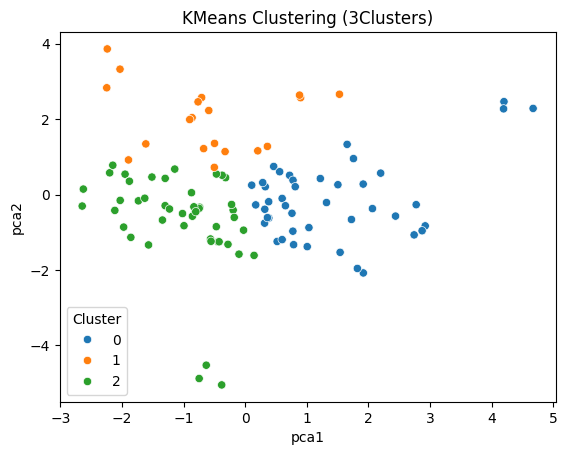

K= 4
Inertia: 177.81738241226927
Silhouette Score: 0.3357342997802079
calinski_harabasz_score: 0.3357342997802079
Davies-Bouldin Index: 0.9400453672121205


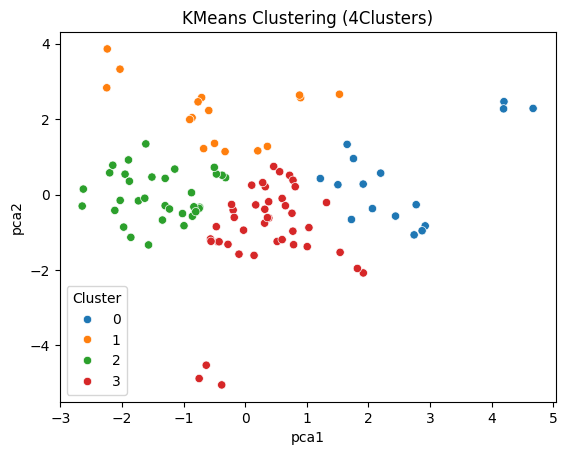

K= 5
Inertia: 157.2169686429771
Silhouette Score: 0.3199076673475243
calinski_harabasz_score: 0.3199076673475243
Davies-Bouldin Index: 0.9803655309073361


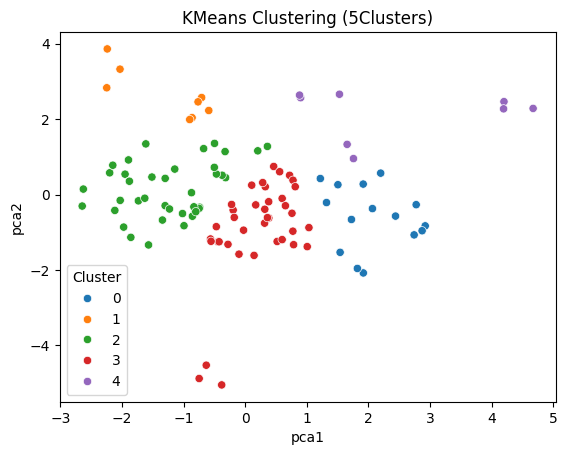

K= 6
Inertia: 118.5044480496201
Silhouette Score: 0.36643520902735416
calinski_harabasz_score: 0.36643520902735416
Davies-Bouldin Index: 0.7710647810038515


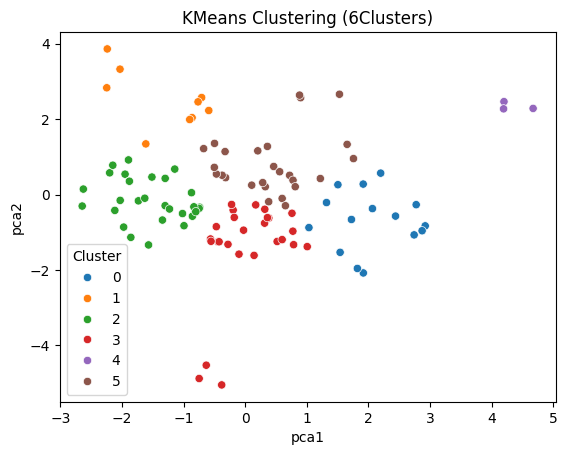

In [ ]:
ch_lst=[]
dbi_lst=[]
sil_lst=[]
for k in range(3,7):
  print("K=",k)
  kmeans = KMeans(n_clusters=k, random_state=42)
  kmeans.fit(X_pca)

  # Add cluster labels to the original DataFrame
  labels= kmeans.labels_

  # Print the result
  print("Inertia:", kmeans.inertia_)
  score = silhouette_score(X_pca, kmeans.labels_)
  sil_lst.append(score)
  print("Silhouette Score:", score)
  s = calinski_harabasz_score(X_pca, labels)
  ch_lst.append(s)
  print("calinski_harabasz_score:", score)
  dbi = davies_bouldin_score(X_pca, labels)
  dbi_lst.append(dbi)
  print(f"Davies-Bouldin Index: {dbi}")
  # Visualize the clusters
  sns.scatterplot(x=X_pca["pca1"],y=X_pca["pca2"],hue=labels,palette='tab10')
  plt.xlabel('pca1')
  plt.ylabel('pca2')
  plt.legend(title='Cluster')
  plt.title(f'KMeans Clustering ({k}Clusters)')
  plt.show()

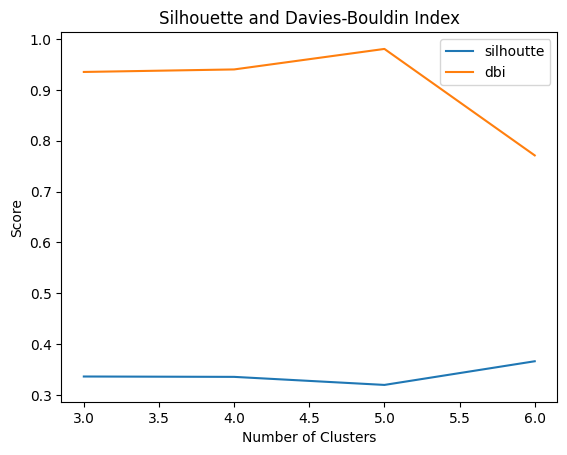

In [ ]:
plt.plot(range(3, 7), sil_lst, label="silhoutte")
plt.plot(range(3, 7), dbi_lst, label="dbi")
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.legend()
plt.title('Silhouette and Davies-Bouldin Index')
plt.show()

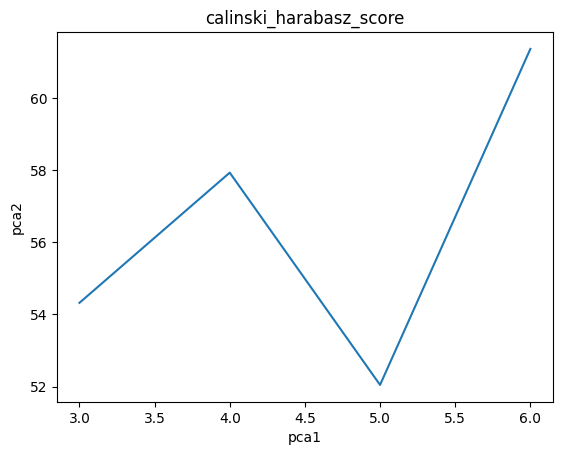

In [ ]:

plt.plot(range(3,7),ch_lst)
plt.xlabel('pca1')
plt.ylabel('pca2')
plt.title('calinski_harabasz_score')
plt.show()

In [ ]:
print(f"dbi scores:\n {dbi_lst}")
print(f"silhouette score:\n {sil_lst}")
print(f"calinski harbasz score:\n {ch_lst}")

dbi scores:
 [np.float64(0.9350950975506714), np.float64(0.9400453672121205), np.float64(0.9803655309073361), np.float64(0.7710647810038515)]
silhouette score:
 [np.float64(0.33644419438140477), np.float64(0.3357342997802079), np.float64(0.3199076673475243), np.float64(0.36643520902735416)]
calinski harbasz score:
 [np.float64(54.32169008404355), np.float64(57.93295002831215), np.float64(52.04454273078607), np.float64(61.36488548561178)]


# **k = 6, based on the lowest DBI and relatively stable silhouette/calinski harabasz scores**

K= 6
Inertia: 118.5044480496201
Silhouette Score: 0.36643520902735416
calinski_harabasz_score: 61.36488548561178
Davies-Bouldin Index: 0.7710647810038515


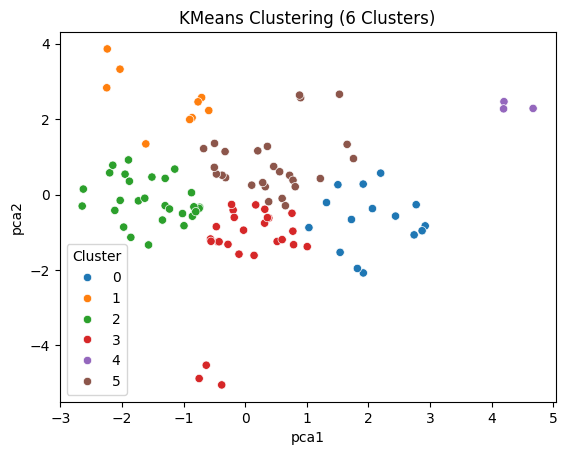

In [ ]:
k=6
print(f"K= {k}")
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(X_pca)

  # Add cluster labels to the original DataFrame
labels= kmeans.labels_

  # Print the result
print("Inertia:", kmeans.inertia_)
score = silhouette_score(X_pca, kmeans.labels_)
print("Silhouette Score:", score)
s = calinski_harabasz_score(X_pca, labels)
print("calinski_harabasz_score:", s)
dbi = davies_bouldin_score(X_pca, labels)
print(f"Davies-Bouldin Index: {dbi}")
  # Visualize the clusters
sns.scatterplot(x=X_pca["pca1"],y=X_pca["pca2"],hue=labels,palette='tab10')
plt.xlabel('pca1')
plt.ylabel('pca2')
plt.legend(title='Cluster')
plt.title(f'KMeans Clustering ({k} Clusters)')
plt.show()

In [ ]:
data_clustered["output_labels(6)"]=labels

In [ ]:
data_clustered

,Plant Height (PH),Number of Pods (NP),Biological Weight (BW),Sugars (Su),Relative Water Content in Leaves (RWCL),ChlorophyllA663,Chlorophyllb649,Protein Percentage (PPE),Weight of 300 Seeds (W3S),Leaf Area Index (LAI),...,Number of Seeds per Pod (NSP),Protein Content (PCO),C,S,G,cluster_label_5-Cluster Model,cluster_label_6-Cluster Model,cluster_label_7-Cluster-Model,cluster_label_6-Cluster-tSNE model,output_labels(6)
0,0.177164,-0.731058,-0.072110,-0.188523,0.690705,-0.891630,0.590306,-1.175971,-0.349841,0.353251,...,-0.651063,1.086519,-1.0,-1.167315,0.87831,1,5,4,5,5
1,-1.788630,-0.646145,-0.705770,-0.607499,0.004383,1.110878,-0.167656,1.016621,-0.189829,0.802088,...,-0.610395,-1.313226,1.0,1.234019,0.29277,3,1,5,5,2
2,0.734139,0.252936,-0.644448,0.052705,0.039882,-0.751103,-0.925618,-1.010492,-0.029817,-0.095586,...,0.080959,-1.243668,1.0,-1.167315,1.46385,3,1,5,5,3
3,0.177164,-0.206594,-0.991938,-1.331185,0.844535,-0.997025,0.506088,-1.051862,3.390443,0.802088,...,0.731646,-1.278447,-1.0,-1.167315,-1.46385,2,2,3,5,0
4,-0.248758,1.531628,-0.848854,1.343489,0.607873,1.251405,-0.251874,1.471688,-0.829878,1.250924,...,-0.569727,0.321383,-1.0,0.033352,1.46385,4,1,2,5,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,-1.952446,3.199922,0.357143,0.784855,2.382843,1.778380,-0.925618,1.513057,-0.829878,-0.544422,...,2.358363,-0.652427,-1.0,0.033352,-0.29277,1,5,4,5,2
104,1.094535,0.752425,0.316262,-1.322721,-0.267779,-0.751103,0.674524,-1.010492,-0.169828,1.250924,...,2.358363,-0.513311,-1.0,1.234019,-0.87831,2,2,3,5,0
105,0.078874,0.168023,0.745515,2.697754,0.110881,0.759561,-1.009836,0.478816,0.370213,1.250924,...,-0.895071,2.234223,1.0,-1.167315,0.87831,4,4,0,4,1
106,0.734139,0.552629,-0.991938,-0.772550,-0.492609,1.040614,-1.094054,-1.548298,-0.009816,0.802088,...,0.324967,-1.174110,1.0,0.033352,0.29277,3,1,5,5,3


In [ ]:
data_clustered.corrwith(data_clustered["output_labels(6)"])

,0
Plant Height (PH),0.139280
Number of Pods (NP),0.162417
Biological Weight (BW),0.199205
Sugars (Su),-0.022569
Relative Water Content in Leaves (RWCL),-0.341324
ChlorophyllA663,0.022276
Chlorophyllb649,-0.050705
Protein Percentage (PPE),-0.110273
Weight of 300 Seeds (W3S),-0.315898
Leaf Area Index (LAI),-0.033030


**soft clusters(without parameters)**

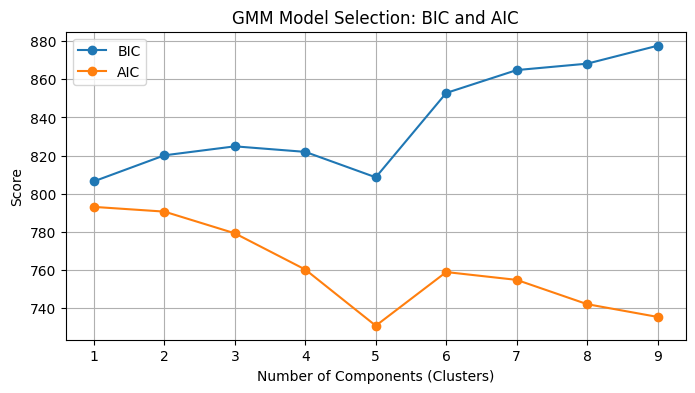

In [ ]:
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
import numpy as np

K= range(1, 10)
bics = []
aics = []

for k in K:
    gmm = GaussianMixture(n_components=k, covariance_type='full', random_state=42)
    gmm.fit(X_pca)
    bics.append(gmm.bic(X_pca))
    aics.append(gmm.aic(X_pca))

# Plot BIC and AIC(lower the better )
plt.figure(figsize=(8, 4))
plt.plot(K, bics, label='BIC', marker='o')
plt.plot(K, aics, label='AIC', marker='o')
plt.xlabel('Number of Components (Clusters)')
plt.ylabel('Score')
plt.title('GMM Model Selection: BIC and AIC')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
k=5
gmm = GaussianMixture(n_components=k, covariance_type='full', random_state=42)
gmm.fit(X_pca)
labels=gmm.predict(X_pca)
score = silhouette_score(X_pca, labels)
print("Silhouette Score:", score)
s = calinski_harabasz_score(X_pca, labels)
print("calinski_harabasz_score:", s)
dbi = davies_bouldin_score(X_pca, labels)
print(f"Davies-Bouldin Index: {dbi}")

Silhouette Score: 0.3125248069156733
calinski_harabasz_score: 40.633959842744105
Davies-Bouldin Index: 0.986909815061486


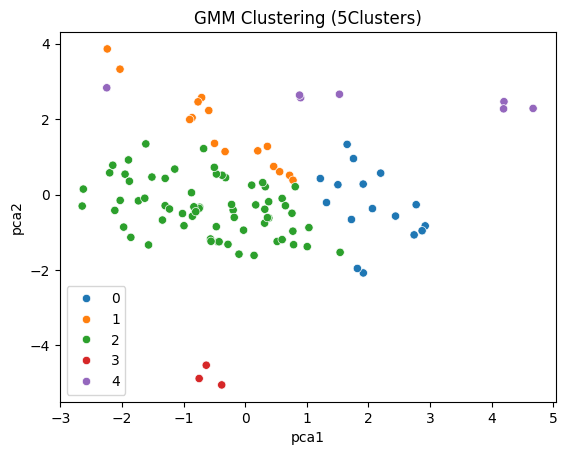

In [ ]:
sns.scatterplot(x=X_pca["pca1"],y=X_pca["pca2"],hue=labels,palette="tab10")
plt.xlabel('pca1')
plt.ylabel('pca2')
plt.legend()
plt.title(f'GMM Clustering ({k}Clusters)')
plt.show()

In [ ]:
data_clustered["GMM_cluster_output"]=labels

In [ ]:
data_clustered.corrwith(data_clustered["GMM_cluster_output"])

,0
Plant Height (PH),0.075284
Number of Pods (NP),-0.027894
Biological Weight (BW),-0.059529
Sugars (Su),0.095089
Relative Water Content in Leaves (RWCL),-0.362848
ChlorophyllA663,0.272707
Chlorophyllb649,-0.078988
Protein Percentage (PPE),-0.058519
Weight of 300 Seeds (W3S),-0.297636
Leaf Area Index (LAI),-0.062585


**Soft clusters(all attributes)**

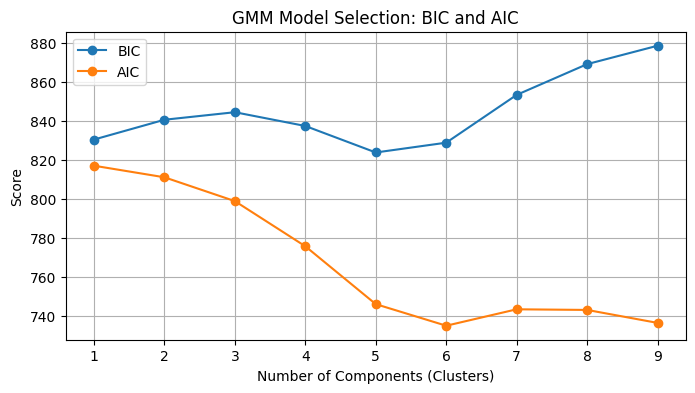

In [ ]:

X=data_v2
pca=PCA(n_components=2)
X_pca=pca.fit_transform(X)
X_pca=pd.DataFrame(X_pca,columns=["pca1","pca2"])
K= range(1, 10)
bics = []
aics = []

for k in K:
    gmm = GaussianMixture(n_components=k, covariance_type='full', random_state=42)
    gmm.fit(X_pca)
    bics.append(gmm.bic(X_pca))
    aics.append(gmm.aic(X_pca))

# Plot BIC and AIC(lower the better )
plt.figure(figsize=(8, 4))
plt.plot(K, bics, label='BIC', marker='o')
plt.plot(K, aics, label='AIC', marker='o')
plt.xlabel('Number of Components (Clusters)')
plt.ylabel('Score')
plt.title('GMM Model Selection: BIC and AIC')
plt.legend()
plt.grid(True)
plt.show()



In [ ]:
print(f"BIC: {bics}")
print(f"AIC: {aics}")

BIC: [np.float64(830.6334147729046), np.float64(840.7920945033695), np.float64(844.6597004026048), np.float64(837.5968058794047), np.float64(824.0062089177075), np.float64(829.0353447732282), np.float64(853.5496581498237), np.float64(869.3170713436797), np.float64(878.7587380645905)]
AIC: [np.float64(817.2227586372835), np.float64(811.2886510050031), np.float64(799.0634695414931), np.float64(775.9077876555476), np.float64(746.224403331105), np.float64(735.1607518238804), np.float64(743.5822778377307), np.float64(743.2569036688413), np.float64(736.6057830270069)]


In [ ]:
optimal_k=6
gmm = GaussianMixture(n_components=optimal_k, covariance_type='full', random_state=42)
gmm.fit(X_pca)
labels=gmm.predict(X_pca)
score = silhouette_score(X_pca, labels)
print("Silhouette Score:", score)
s = calinski_harabasz_score(X_pca, labels)
print("calinski_harabasz_score:", s)
dbi = davies_bouldin_score(X_pca, labels)
print(f"Davies-Bouldin Index: {dbi}")


Silhouette Score: 0.25997877838002853
calinski_harabasz_score: 45.418506040210964
Davies-Bouldin Index: 0.8709092050285552


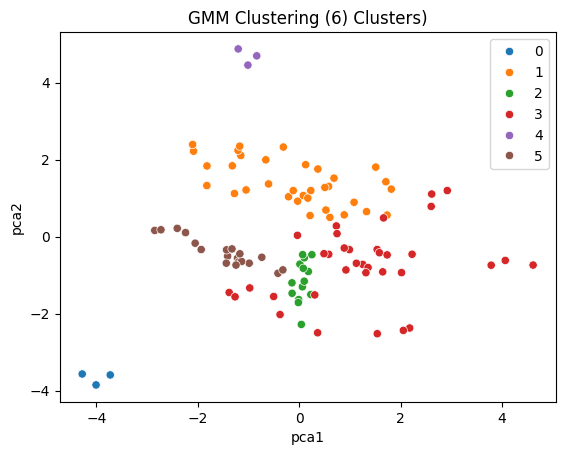

In [ ]:
sns.scatterplot(x=X_pca["pca1"],y=X_pca["pca2"],hue=labels,palette="tab10")
plt.xlabel('pca1')
plt.ylabel('pca2')
plt.legend()
plt.title(f'GMM Clustering ({optimal_k}) Clusters)')
plt.show()

In [ ]:
data_clustered["GMM_cluster(whole)"]=labels

In [ ]:
data_clustered.corrwith(data_clustered["GMM_cluster(whole)"])

,0
Plant Height (PH),0.093928
Number of Pods (NP),-0.137043
Biological Weight (BW),-0.150888
Sugars (Su),-0.168761
Relative Water Content in Leaves (RWCL),0.031749
ChlorophyllA663,0.128045
Chlorophyllb649,-0.241883
Protein Percentage (PPE),0.078861
Weight of 300 Seeds (W3S),0.143854
Leaf Area Index (LAI),-0.179306


# Kmeans clustering on the whole dataset with k=4

In [ ]:
# data_v2

In [ ]:
kmeans_4=KMeans(n_clusters=4)
kmeans_4.fit(data_v2)

KMeans(n_clusters=4)

In [ ]:
predicted_labels_4=kmeans_4.predict(data_v2)

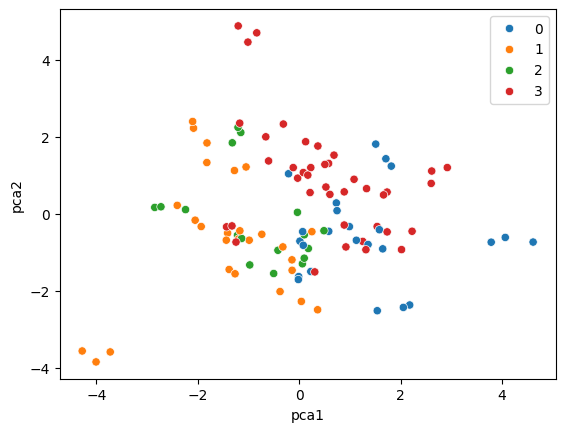

In [ ]:
sns.scatterplot(x=pca_data["PC1"],y=pca_data["PC2"],hue=predicted_labels_4,palette="tab10")
plt.xlabel('pca1')
plt.ylabel('pca2')
plt.legend()

/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


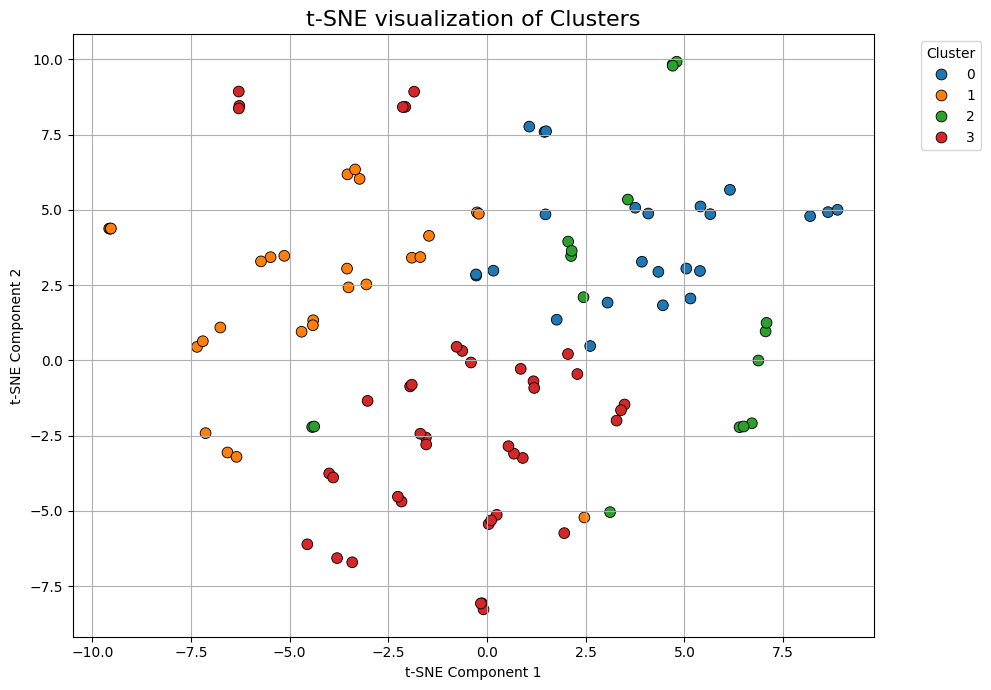

In [ ]:
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
X_tsne = tsne.fit_transform(data_v2)

plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=predicted_labels_4, palette='tab10', s=60, edgecolor='k')

plt.title('t-SNE visualization of Clusters', fontsize=16)
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
data_clustered["kmeans_4_whole_dataset"]=predicted_labels_4

# 5 Cluster with whole dataset

In [ ]:
kmeans_5=KMeans(n_clusters=5)
kmeans_5.fit(data_v2)

KMeans(n_clusters=5)

In [ ]:
predicted_labels_5=kmeans_5.predict(data_v2)
data_clustered['kmeans_5_whole_dataset']=predicted_labels_5

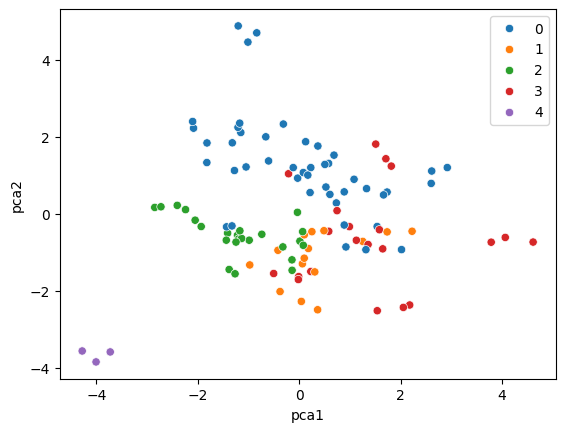

In [ ]:
sns.scatterplot(x=pca_data["PC1"],y=pca_data["PC2"],hue=predicted_labels_5,palette="tab10")
plt.xlabel('pca1')
plt.ylabel('pca2')
plt.legend()

/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


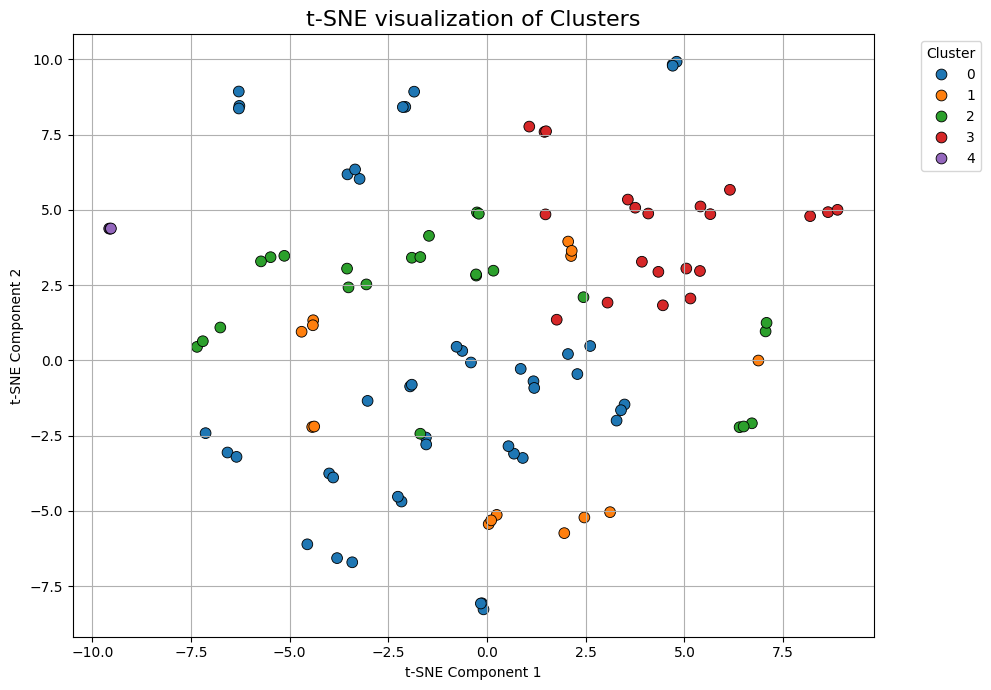

In [ ]:
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
X_tsne = tsne.fit_transform(data_v2)

plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=predicted_labels_5, palette='tab10', s=60, edgecolor='k')

plt.title('t-SNE visualization of Clusters', fontsize=16)
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

# 6 Cluster on whole dataset

In [ ]:
kmeans_6=KMeans(n_clusters=6)
kmeans_6.fit(data_v2)

KMeans(n_clusters=6)

In [ ]:
predicted_labels_6=kmeans_6.predict(data_v2)
data_clustered['kmeans_6_whole_dataset']=predicted_labels_6

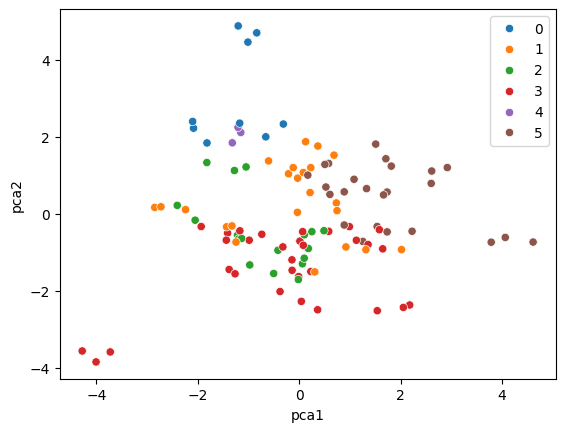

In [ ]:
sns.scatterplot(x=pca_data["PC1"],y=pca_data["PC2"],hue=predicted_labels_6,palette="tab10")
plt.xlabel('pca1')
plt.ylabel('pca2')
plt.legend()

/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


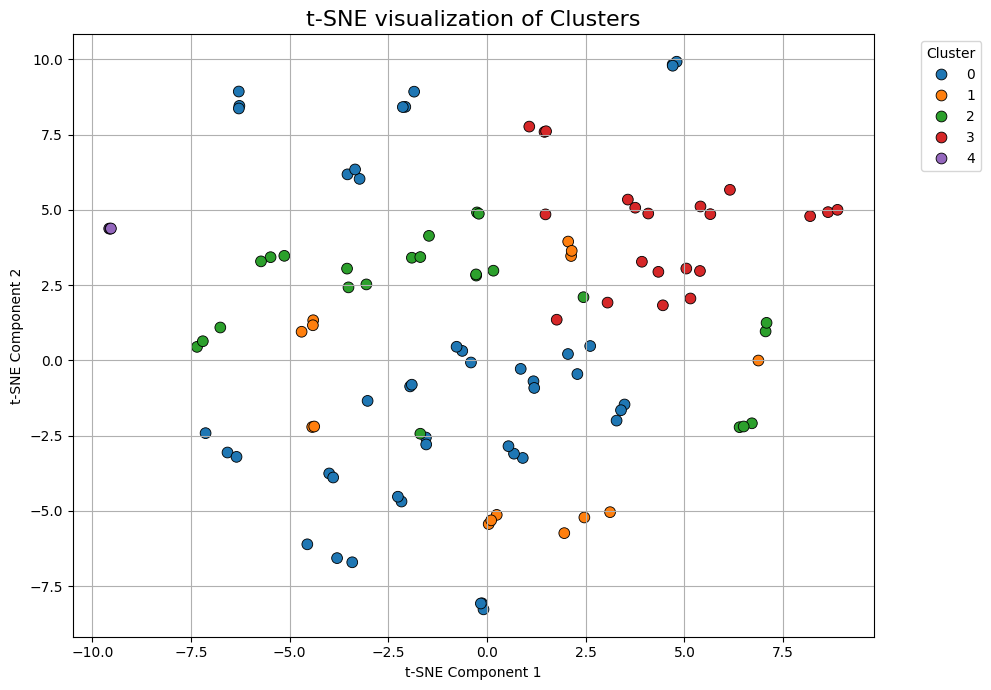

In [ ]:
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
X_tsne = tsne.fit_transform(data_v2)

plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=predicted_labels_5, palette='tab10', s=60, edgecolor='k')

plt.title('t-SNE visualization of Clusters', fontsize=16)
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

# **Analyzing clusters made so far to predict different growth levels**

In [ ]:
output_params=['Seed Yield per Unit Area (SYUA)','Number of Seeds per Pod (NSP)','Protein Percentage (PPE)',
               'Number of Pods (NP)','Sugars (Su)','Relative Water Content in Leaves (RWCL)','Leaf Area Index (LAI)']
columns=['cluster_label_6-Cluster Model','output_labels(6)','GMM_cluster_output', 'GMM_cluster(whole)', 'kmeans_4_whole_dataset','kmeans_5_whole_dataset', 'kmeans_6_whole_dataset']
data_clustered.columns

Index(['Plant Height (PH)', 'Number of Pods (NP)', 'Biological Weight (BW)',
       'Sugars (Su)', 'Relative Water Content in Leaves (RWCL)',
       'ChlorophyllA663', 'Chlorophyllb649', 'Protein Percentage (PPE)',
       'Weight of 300 Seeds (W3S)', 'Leaf Area Index (LAI)',
       'Seed Yield per Unit Area (SYUA)', 'Number of Seeds per Pod (NSP)',
       'Protein Content (PCO)', 'C', 'S', 'G', 'cluster_label_5-Cluster Model',
       'cluster_label_6-Cluster Model', 'cluster_label_7-Cluster-Model',
       'cluster_label_6-Cluster-tSNE model', 'output_labels(6)',
       'GMM_cluster_output', 'GMM_cluster(whole)', 'kmeans_4_whole_dataset',
       'kmeans_5_whole_dataset', 'kmeans_6_whole_dataset'],
      dtype='object')

In [ ]:
for param in output_params:

  for cluster_col in columns:
    groups = [data_clustered[data_clustered[cluster_col] == label][param] for label in data_clustered[cluster_col].unique()]
    stat, p = kruskal(*groups)  # Kruskal-Wallis Test
    print(f"{param}: p-value = {p:.5f} in {cluster_col}")

Seed Yield per Unit Area (SYUA): p-value = 0.00000 in cluster_label_6-Cluster Model
Seed Yield per Unit Area (SYUA): p-value = 0.00000 in output_labels(6)
Seed Yield per Unit Area (SYUA): p-value = 0.00000 in GMM_cluster_output
Seed Yield per Unit Area (SYUA): p-value = 0.00000 in GMM_cluster(whole)
Seed Yield per Unit Area (SYUA): p-value = 0.03115 in kmeans_4_whole_dataset
Seed Yield per Unit Area (SYUA): p-value = 0.00000 in kmeans_5_whole_dataset
Seed Yield per Unit Area (SYUA): p-value = 0.00000 in kmeans_6_whole_dataset
Number of Seeds per Pod (NSP): p-value = 0.00006 in cluster_label_6-Cluster Model
Number of Seeds per Pod (NSP): p-value = 0.00000 in output_labels(6)
Number of Seeds per Pod (NSP): p-value = 0.00035 in GMM_cluster_output
Number of Seeds per Pod (NSP): p-value = 0.00013 in GMM_cluster(whole)
Number of Seeds per Pod (NSP): p-value = 0.01225 in kmeans_4_whole_dataset
Number of Seeds per Pod (NSP): p-value = 0.00696 in kmeans_5_whole_dataset
Number of Seeds per Pod (

In [ ]:
# cluster_summary = {}

# for cluster_col in output_params:
#     summary = data_clustered.groupby(cluster_col)[columns].agg(['mean', 'std'])
#     cluster_summary[cluster_col] = summary
#     # print(f"\nSummary for {cluster_col}:\n", summary)
# cluster_summary

data_clustered[output_params+columns].corr()

,Seed Yield per Unit Area (SYUA),Number of Seeds per Pod (NSP),Protein Percentage (PPE),Number of Pods (NP),Sugars (Su),Relative Water Content in Leaves (RWCL),Leaf Area Index (LAI),cluster_label_6-Cluster Model,output_labels(6),GMM_cluster_output,GMM_cluster(whole),kmeans_4_whole_dataset,kmeans_5_whole_dataset,kmeans_6_whole_dataset
Seed Yield per Unit Area (SYUA),1.000000,0.353017,0.032834,0.217267,-0.255296,-0.140857,0.093657,0.369634,0.074090,-0.233026,-0.140341,0.264635,-0.439962,-0.411262
Number of Seeds per Pod (NSP),0.353017,1.000000,0.092262,0.053794,-0.205621,0.083655,-0.101105,0.040895,-0.129483,-0.104681,-0.095537,0.068423,-0.171223,-0.236756
Protein Percentage (PPE),0.032834,0.092262,1.000000,-0.079503,-0.000679,0.283222,-0.081803,0.133039,-0.110273,-0.058519,0.078861,0.440560,-0.325332,-0.011990
Number of Pods (NP),0.217267,0.053794,-0.079503,1.000000,-0.039652,-0.170033,0.178099,0.274703,0.162417,-0.027894,-0.137043,0.183030,-0.279156,0.258573
Sugars (Su),-0.255296,-0.205621,-0.000679,-0.039652,1.000000,0.027650,0.155117,-0.002452,-0.022569,0.095089,-0.168761,-0.073209,0.097397,0.328974
Relative Water Content in Leaves (RWCL),-0.140857,0.083655,0.283222,-0.170033,0.027650,1.000000,-0.262679,-0.097667,-0.341324,-0.362848,0.031749,0.218395,-0.141906,-0.169321
Leaf Area Index (LAI),0.093657,-0.101105,-0.081803,0.178099,0.155117,-0.262679,1.000000,0.113087,-0.033030,-0.062585,-0.179306,0.019127,-0.301250,0.196615
cluster_label_6-Cluster Model,0.369634,0.040895,0.133039,0.274703,-0.002452,-0.097667,0.113087,1.000000,0.172305,-0.175312,-0.130592,0.301861,-0.301662,0.177598
output_labels(6),0.074090,-0.129483,-0.110273,0.162417,-0.022569,-0.341324,-0.033030,0.172305,1.000000,0.391498,-0.073072,-0.066221,0.090212,-0.023555
GMM_cluster_output,-0.233026,-0.104681,-0.058519,-0.027894,0.095089,-0.362848,-0.062585,-0.175312,0.391498,1.000000,0.228200,-0.239365,0.365860,0.196629


In [ ]:
syua_means = data_clustered.groupby('kmeans_6_whole_dataset')['Seed Yield per Unit Area (SYUA)'].describe().sort_values(by='min')
syua_means

,count,mean,std,min,25%,50%,75%,max
kmeans_6_whole_dataset,,,,,,,,
3,31.0,-0.854144,0.643834,-1.806676,-1.493872,-0.940781,-0.219722,0.144144
5,24.0,-0.178289,0.656153,-1.446366,-0.428624,-0.084076,0.120970,1.274937
1,23.0,0.385765,0.741174,-1.086056,-0.114561,0.660117,0.898166,1.280051
2,18.0,0.070317,0.598835,-0.927516,-0.329017,-0.025623,0.583544,1.130462
0,9.0,1.776384,0.792763,0.591315,1.003087,1.907577,2.426347,2.759328
4,3.0,1.543884,0.073593,1.459208,1.519619,1.580030,1.586223,1.592416


In [ ]:
sugar_means = data_clustered.groupby('kmeans_4_whole_dataset')['Sugars (Su)'].describe().sort_values(by='min')
sugar_means

,count,mean,std,min,25%,50%,75%,max
kmeans_4_whole_dataset,,,,,,,,
1,27.0,-0.799980,0.599878,-1.339649,-1.320605,-0.899513,-0.632892,0.573251
2,17.0,-0.206448,1.007822,-1.339649,-1.191526,-0.620196,0.755230,1.622806
3,40.0,0.160411,0.702568,-1.132277,-0.144087,0.209292,0.587005,1.343489
0,24.0,0.778859,1.133485,-0.565178,-0.090128,0.226220,1.824888,2.697754
